<a href="https://colab.research.google.com/github/SergeiVKalinin/PNNL_ML_2024/blob/main/Day_3_FerroicBlocks_mockup_paper_v3a.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Note for the course:
- Originally published in 2019 as https://chemrxiv.org/engage/chemrxiv/article-details/60c74146567dfe2305ec3d40
- Version of record: https://pubs.aip.org/aip/apl/article/115/5/052902/571560/Building-ferroelectric-from-the-bottom-up-The

*This is a "jupyter paper" that shows a possibility to write/submit/publish scientific papers as jupyter notebooks. The paper is interactive meaning that you can run the code yourself to reproduce all the results. The code is intermixed with the usual paper's text and figures (the code sections should appear hidden by default).*
# Building ferroelectric from the bottom up: the machine learning analysis of the atomic-scale ferroelectric distortions

M. Ziatdinov$^{1,2}$, C. Nelson$^1$, R. K. Vasudevan,$^1$ D.Y. Chen,$^3$, S.V. Kalinin$^1$

$^1$Center for Nanophase Materials Sciences, $^2$Computational Sciences and Engineering Division, Oak Ridge National Laboratory, Oak Ridge, TN 37831

$^3$Institute for Advanced Materials and Guangdong Provincial Key Laboratory of Optical Information Materials and Technology, South China Academy of Optoelectronics, South China Normal University, Guangzhou 510006, China

# Import/install python modules (code)

This should not take more than several minutes.

We first download files specific to this analysis (experimental data, neural network skeleton,  trained weights, etc.):

In [1]:
%%shell
git clone https://github.com/jupyter-papers/FerroicBlocks.git
sh FerroicBlocks/packages.sh modules

Cloning into 'FerroicBlocks'...
remote: Enumerating objects: 201, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 201 (delta 0), reused 0 (delta 0), pack-reused 198
Receiving objects: 100% (201/201), 52.92 MiB | 13.09 MiB/s, done.
Resolving deltas: 100% (93/93), done.


Found existing installation of PyTorch
Version: 2.3.0+cu121


Checking if PyTorch sees Colab GPU device...
Available GPU devices:
Tesla T4


Installing packages for vizualization of neural networks -->

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.
  Cloning https://github.com/szagoruyko/pytorchviz to /tmp/pip-req-build-son481cm
  Running command git clone --filter=blob:none --quiet https://github.com/szagoruyko/pytorchviz /tmp/pip-req-build-son481cm
  Resolved https://github.com/szagoruyko/pyto

Finally, we import all necessary python modules:

In [2]:
# I/O, data manipulation and plotting
import os
from google.colab import files
import time
import numpy as np
from sklearn.utils import shuffle
import cv2
from scipy import ndimage
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [3]:
# neural networks
import torch
from FerroicBlocks import dcnn
from FerroicBlocks.utils import *

In [4]:
# clustering/unmixing and dimensionality reduction
from sklearn import mixture, cluster
from sklearn import decomposition, manifold

# Abstract (text)

Recent advances in scanning transmission electron microscopy (STEM) have enabled direct visualization of the atomic structure of ferroic materials, enabling the determination of atomic column positions with ~pm precision. This, in turn, enabled direct mapping of ferroelectric and ferroelastic order parameter fields via the top-down approach, where the atomic coordinates are directly mapped on the mesoscopic order parameters. Here, we explore the alternative bottom-up approach, where the atomic coordinates derived from the STEM image are used to explore the extant atomic displacement patterns in the material and build the collection of the building blocks for the distorted lattice. This approach is illustrated for the La-doped BiFeO$_3$ system.

# Introduction (text)

After more than 70 years of intensive research, ferroelectrics remain one of the most fascinating materials classes [1, 2]. This is both due to a broad spectrum of applications ranging from non-volatile electronics[3] to electromechanical and optoelectronic devices [4], and a dazzling array of the physical phenomena and functionalities [5]. The issues such as the nature of the morphotropic and relaxor states [6, 7], ferroelectric and size effects [4], coupling between polarization and chemica [8], transport [9], and light [10] phenomena have captured the attention of scientific community worldwide.
	Until recently, the insights into the fundamental physics of ferroelectric materials were derived using the synergy of macroscopic measurements and neutron and X-Ray scattering techniques. The invention of Piezoresponse Force Microscopy (PFM) and associated spectroscopic techniques have opened the realm of mesoscopic phenomena including polarization and domain wall dynamics, domain switching, and non-linear responses for exploration [11-16]. The structural information on comparable length scales has become available via the focused X-Ray and tomographic techniques [17]. However, the associated atomistic mechanisms have remained poorly understood until the last decade, when the spatial resolution and information limit in transmission and scanning transmission electron microscopy techniques (TEM and STEM) have allowed the mapping of structural distortions within the unit cells, and hence mapping the mesoscopic ferroelectric order parameter field.
	This approach was pioneered in TEM by Jia [18] and in STEM by Chisholm [19] and Borisevich [20], and further extended by Nelson [21]. Mundy [22], Rossell [23], and others. Here, the atomic positions of cations and anions within a unit cell are used to derive the polarization, either directly as a weighted sum of the effective Born charges, or indirectly when a certain measure of unit cell asymmetry is assumed to be proportional to the polarization vector. Thus derived polarization fields can be used as a qualitative measure of materials functionality. Beyond the qualitative description, the polarization distributions in the vicinity of surfaces, interfaces, or topological defects can be directly matched to the solutions of the Ginzburg-Landau equations to extract the magnitude of the gradient and gradient coupling terms such as flexoelectricity [24-26] or the correlation and screening lengths describing boundary conditions at surfaces and interfaces [27], and in certain cases extended to the interfacial electrochemistry [28, 29].
	However, these analyses relied until now on the postulated relationship between experimentally determined atomic coordinates and the polarization vector. In more complex analyses, the bulk form of the Ginzburg-Landau free energy was additionally adopted as determined from macroscopic thermodynamic and scattering studies [24-26]. However, in many materials systems such as morphotropic and relaxor ferroelectrics, the nature of the order parameter itself and hence corresponding free energy expansions are actively debated. Correspondingly, of interest is the question whether these descriptors can be obtained from the experimental data, as opposed to being postulated. We further note that even the nature of the local descriptors of molecular structures is one of the key issues determining the efficiency and performance of machine learning algorithms for materials property prediction and optimization, and hence deriving these from experimental data is a target of interest for both machine learning / artificial intelligence (ML / AI) community, and condensed matter physics.
	Here we explore the nature of the building blocks in the morphotropic ferroelectric systems using the statistical analysis of the atomically-resolved STEM data using fully unsupervised analysis. Using the deep-learning analysis, we identify the localization of atomic columns in the form of the probability density field. We further explore the use of several linear statistical unmixing techniques including Gaussian mixture models and independent component analysis to build the library of structural distortions and the associated domain structures. These analyses and fully integrated workflow are available as a part of publication. Further perspectives for the analysis are discussed.


# Results and Discussion (code + text)

## Image processing with deep learning (text)

As our model system we acquired STEM images from BiFeO$_3$ thin films doped with La to La$_{0.17}$Bi$_{0.83}$FeO$_3$, driving the system near a morphotropic phase boundary between ferroelectric rhombohedral (R) and nonpolar/antipolar orthorhombic (O) phases [30]. The films were grown by pulsed laser deposition and exhibit a mixture of these two phases, as detailed in ref [30]. High Angle Annular Dark Field (HAADF) STEM images were acquired on a C$_s$ corrected FEI Titan at 300kV. The HAADF-STEM images are input to the neural network analysis in their raw format, i.e. they are single raster scan datasets with no denoising or other pre-processing. In particular, the low conductivity of the LBFO results in time-varied sample charging under the electron beam which manifests in slow-scan axis artifacts. This MPB composition dataset presents a diversity of phases and orientations within a small region, each nominally distinguishable by subtle symmetry breaking from the cubic perovskite structure but with significant scan error/noise.


As a first step of the analysis, we adopt a deep learning neural network analysis to convert noisy experimental data into atomic coordinates of different atomic species. We used a U-net-like fully convolutional neural network (FCNN) [31] supplemented by the dilated convolutions in the bottleneck layer, which allows performing the simultaneous mixed-scale de-noising of the atomic image and separation of atomic columns with different intensities into different “channels”/classes. The training set was generated for a regular square bipartite lattice without any specific knowledge of the particular system. The atomic objects (columns) were represented as 2D gaussian objects. Once a model is trained, it allows rapid identification of atomic positions based on local contrast. We notice that the same model can be also in principle used for the analysis of surfaces with bipartite lattice structure in the scanning tunneling microscopy experiments [32]. The output of the FCNN is a probability density field, where for each pixel the probability of belonging to a given type of atomic column is shown in Figure 1. While it is possible to use other methods (peak-fitting) for finding atoms in the high-quality data with minimal noise/distortions, the deep learning-based approach also works in the presence of high levels of noise and larger image distortions where the “standard” methods may fail, as was demonstrated for STEM experiments on 2D materials [33, 34].

![Figure 1](https://github.com/jupyter-papers/FerroicBlocks/raw/master/figures/Figure1.png)
**Figure 1.** *(a) Experimental image of La-doped BiFeO$_3$ system LBFO. (b, c) Neural network output consisting of two channels corresponding to different atomic sublattices. (d) Principal component analysis (PCA) scree plot showing the explained variance as a function of the number of PCA components for different cell size d, that is, different size of sub-images extracted from the neural network output as shown in (e), where “red” and “green” are the two sublattices shown in (b, c) and “blue” is a background class. The inset in (d) shows a variance for each of the first 4 PCA components as a function of the effective cell size d.*

## Image processing with deep learning (code)

### Neural network training (code)

**Important**: *in this notebook we provide an already trained model and therefore one can skip this code section (i.e. model training) and go directly to the next code section titled 'Neural networks: inference on experimental data'.*

We start with downloading our training data (~1-2 minutes):

In [5]:
%%shell
sh FerroicBlocks/packages.sh dataset


  Attempting uninstall: gdown
    Found existing installation: gdown 5.1.0
    Uninstalling gdown-5.1.0:
      Successfully uninstalled gdown-5.1.0
Downloading...
From (original): https://drive.google.com/uc?id=10wo3fWl6lbD0p7S_gJ241BKJ05v6KL2U
From (redirected): https://drive.google.com/uc?id=10wo3fWl6lbD0p7S_gJ241BKJ05v6KL2U&confirm=t&uuid=bfab9b3f-ca84-4069-bfd0-d51559d2990f
To: /content/BFO-ts1-512.hdf5
100% 1.26G/1.26G [00:29<00:00, 43.2MB/s]


We also import packages for model vizualization:

In [6]:
# vizualization tools for neural networks
import pydot
from torchviz import make_dot

Next we initialize our neural network. It has a contracting path consisting of regular convolutional operations followed by max-pooling operation, a bottleneck layer with three layers of atrous convolutions with different dilation rates, and an expanding path with bilinear upsampling that has the same convolutional blocks as the contracting path but in a reversed order. The skip connections provide a flow of information between contracting and expanding pathes.The final layer provides a pixel wise classification of the input data.

In [7]:
model = dcnn.ferronet(nb_classes=3)

We can visualize the model that we just initialized (entirely optional - feel free to skip this step and go directly to model compilation and training):

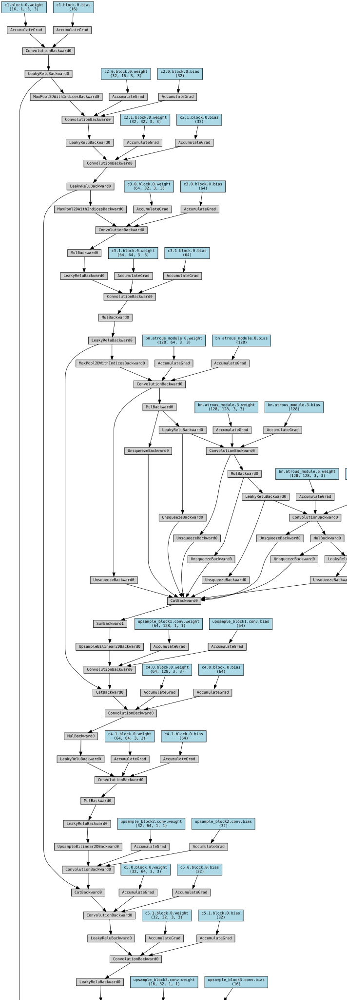

In [8]:
x = torch.randn(1, 1, 256, 256).requires_grad_(False)
y = model(x)
make_dot(y, params=dict(list(model.named_parameters()) + [('x', x)]))

Here we compile our model:

In [9]:
# Move the initialized model to GPU
model.cuda()
# specify loss function
criterion = torch.nn.NLLLoss()
# specify optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)

We are now going to train a model for cleaning image data and and idenifying different types of atoms in a square bipartite system. We specify a path/filename for the training set that we have downloaded and a batch size:

In [10]:
# Training data filepath:
hf_file = 'BFO-ts1-512.hdf5'
# batch size:
batch_size = 30

We initialize a batch generator and produce a batch of training images with corresponding ground truth for illustration purposes:

In [11]:
gen = generate_batches(hf_file, batch_size)
train_imgs, gt = next(gen.batch(0))
gen.close_()

Here we plot the produced  training image - ground truth pair:

(notice that this is a training set for two interlocked square lattices not specific to the material of the current study )

Text(0.5, 1.0, 'Ground truth')

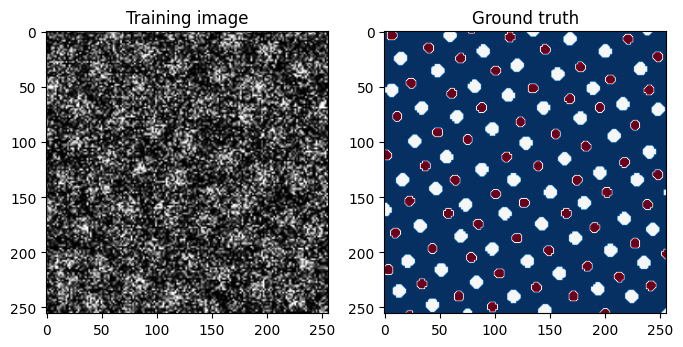

In [12]:
k = -2
fig, ax = plt.subplots(1, 2, figsize = (8, 8))
ax[0].imshow(train_imgs[k, 0, :, :], cmap = 'gray')
ax[0].set_title('Training image')
ax[1].imshow(gt[k], cmap = 'RdBu', interpolation = 'Gaussian')
ax[1].set_title('Ground truth')

Finally, we train our model.

*Notice that when we train a model using simulated data and later want to apply it to experimental data, the only validation that matters is model perfomance on experimental data afterwads*. There can be situations when a model performs very nicely on a simulated 'validation set' and then fails on real experimental data.

In [13]:
# Choose number of training epochs
epochs = 64

train_losses, test_losses = [], []
# Initiate batch generator. Notice that we will be
# randomly changing images size during the model training
gen = generate_batches(hf_file, batch_size, (256-64, 256+64+1, 32))
steps = gen.steps()
steps_val = gen.steps(mode = 'val')
# Train a model
for e in range(epochs):
    print("\nEpoch {}/{}".format(e+1, epochs))
    # Training mode
    model.train()
    running_loss_train = 0
    start = time.time()
    steps = shuffle(steps)
    for i, s in enumerate(steps):
        print("\rTraining mode", 4*".",
              "Batch {}/{}".format(i+1, len(steps)),
              end = "")
        # get image-ground truth pair
        images, labels = next(gen.batch(s))
        # transfer the pair to a gpu device
        images, labels = images.cuda(), labels.cuda()
        # zero the parameter gradients
        optimizer.zero_grad()
        # forward --> backward --> optimize
        log_prob = model.forward(images)
        loss = criterion(log_prob, labels)
        running_loss_train += loss.item()
        loss.backward()
        optimizer.step()

    # Evaluate current on a validation set
    else:
        time_per_batch = (time.time()-start)/len(steps)
        # Validation ode
        model.eval()
        running_loss_test = 0
        print()
        # Disable gradient information
        with torch.no_grad():
            for i, s in enumerate(steps_val):
                print("\rValidation mode", 4*".",
                      "Batch {}/{}".format(i+1, len(steps_val)),
                      end = "")
                # Forward path (no backprop)
                images, labels = next(gen.batch(s, mode='val'))
                images, labels = images.cuda(), labels.cuda()
                log_prob = model.forward(images)
                loss = criterion(log_prob, labels)
                running_loss_test += loss.item()
        train_losses.append(running_loss_train/len(steps))
        test_losses.append(running_loss_test/len(steps_val))

        # print statistics
        print("\nTraining loss: {:.4f}".format(train_losses[-1]),
             8*".", "Test loss: {:.4f}".format(test_losses[-1]),
             8*".", "Time per batch: {:.2f} {}".format(time_per_batch, "s"))

    # save model weights if validation loss has decreased
    if e > 0 and test_losses[e] < min(test_losses[:e]):
        print("Saving checkpoint weights...")
        torch.save(model.state_dict(), 'atomfinder-'+
                   hf_file.split('.')[0]+'-1-best_weights.pt')
    if e == epochs-1:
        print('\nFinished model training')

# save the final weights
torch.save(model.state_dict(), 'atomfinder-'+hf_file.split('.')[0]+'-1.pt')
gen.close_()


Epoch 1/64
Training mode .... Batch 1/32

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Training mode .... Batch 32/32
Validation mode .... Batch 8/8
Training loss: 0.7011 ........ Test loss: 0.5743 ........ Time per batch: 0.28 s

Epoch 2/64
Training mode .... Batch 32/32
Validation mode .... Batch 8/8
Training loss: 0.5550 ........ Test loss: 0.5526 ........ Time per batch: 0.26 s
Saving checkpoint weights...

Epoch 3/64
Training mode .... Batch 32/32
Validation mode .... Batch 8/8
Training loss: 0.5435 ........ Test loss: 0.5445 ........ Time per batch: 0.22 s
Saving checkpoint weights...

Epoch 4/64
Training mode .... Batch 32/32
Validation mode .... Batch 8/8
Training loss: 0.5041 ........ Test loss: 0.5166 ........ Time per batch: 0.26 s
Saving checkpoint weights...

Epoch 5/64
Training mode .... Batch 32/32
Validation mode .... Batch 8/8
Training loss: 0.4636 ........ Test loss: 0.4530 ........ Time per batch: 0.25 s
Saving checkpoint weights...

Epoch 6/64
Training mode .... Batch 32/32
Validation mode .... Batch 8/8
Training loss: 0.4317 ........ Test loss: 0.475

Plot test/train losses vs. epochs:

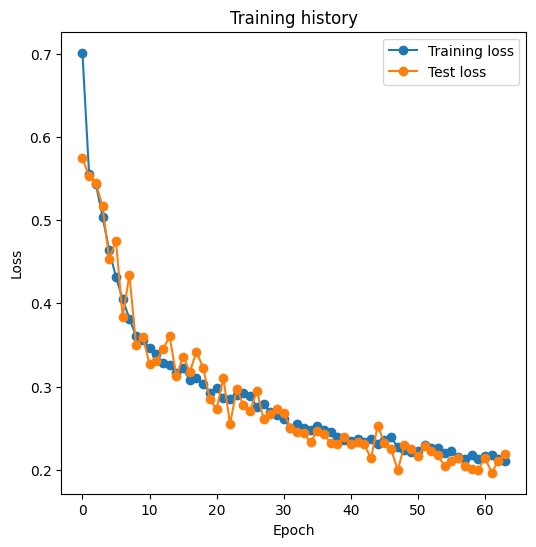

In [14]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.plot(train_losses, '-o', label = 'Training loss')
ax.plot(test_losses, '-o', label = 'Test loss')
ax.set_title('Training history')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.legend(loc = 'upper right')

Download weights to your local machine (and/or google drive if you are on ChromeOS):

In [15]:
best_weights = 'atomfinder-' + hf_file.split('.')[0] + '-1-best_weights.pt'
final_weights = 'atomfinder-' + hf_file.split('.')[0] +'-1.pt'
files.download(best_weights)
files.download(final_weights)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Inference on experimental data (code)

We will now use the trained network to make an inference on real experimental data. First we load the best weights from our trained network into a model skeleton. Notice that we already provide the trained weights together with this notebook and therefore if you do not want to train a model, you can just load the saved weights by running the cell below. Alternatively, if you did traine a model using this notebook, you may modify a filepath to load the weights of a model that you just trained (it is already there, you just need to uncomment the second line)

In [16]:
weights_filepath = 'FerroicBlocks/saved_models/atomfinder-BFO-ts1-512-1-best_weights.pt'
#weights_filepath = 'atomfinder-BFO-ts1-512-1-best_weights.pt'
model = dcnn.ferronet(nb_classes=3)
model = dcnn.load_torchmodel(weights_filepath, model)

Set a directory for saving figures, which we can later download to a local machine.

In [17]:
mdirectory = 'Figures/'
if not os.path.exists(mdirectory):
    os.makedirs(mdirectory)

Choose the experimental image to work with and load it into the notebook:

In [18]:
dirname = 'FerroicBlocks/exp_data/'
image_filename = '22.06.02_2.npy'
#image_filename = '21.03.42_2.npy' # another image
STEM_real = np.load(dirname+image_filename)
STEM_real = torch_format(STEM_real)

Make a prediction (pixel-wise):

In [19]:
X_prob = predict(STEM_real, model, gpu=True)

Plot results:

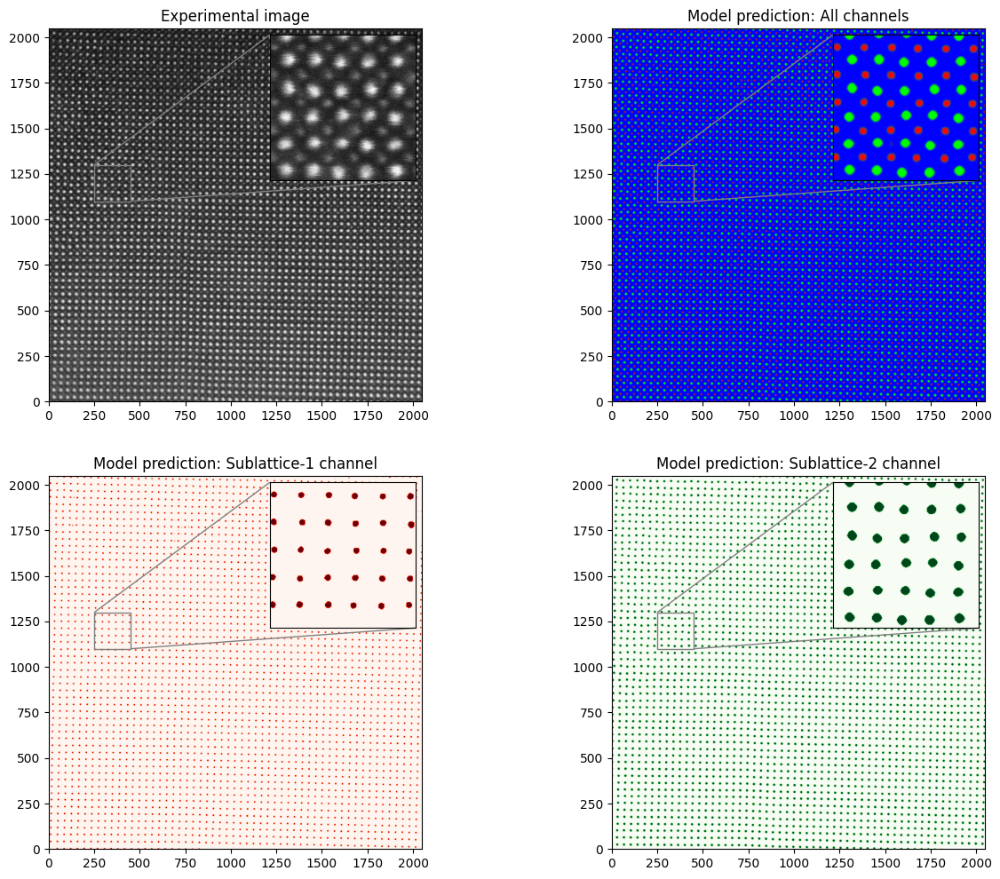

In [20]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
# frame to vizualize (thi this case, we have only one frame)
k = 0
# Parameters for zoomins
zmx1, zmx2 = 250, 450
zmy1, zmy2 = 1100, 1300
extent =(0, 2048, 0, 2048)
# do plotting
fig, ax = plt.subplots(2, 2, figsize = (15, 12))
ax[0, 0].imshow(STEM_real[k, 0, :, :], extent=extent, cmap = 'gray')
ax[0, 0].set_title('Experimental image')
ax[0, 1].imshow(X_prob[k], extent=extent, interpolation = 'Gaussian')
ax[0, 1].set_title('Model prediction: All channels')
ax[1, 0].imshow(X_prob[k,:,:,0]>0.5, extent=extent, cmap='Reds', interpolation='Gaussian')
ax[1, 0].set_title('Model prediction: Sublattice-1 channel')
ax[1, 1].imshow(X_prob[k,:,:,1]>0.5, extent=extent, cmap='Greens', interpolation='Gaussian')
ax[1, 1].set_title('Model prediction: Sublattice-2 channel')
axins_00 = zoomed_inset_axes(ax[0, 0], 4, loc=1)
axins_00.imshow(STEM_real[k, 0, :, :], extent=extent, cmap='gray')
axins_00.set_xlim(zmx1, zmx2)
axins_00.set_ylim(zmy1, zmy2)
axins_00.set_xticks([])
axins_00.set_yticks([])
mark_inset(ax[0, 0], axins_00, loc1=2, loc2=4, fc="none", ec="0.5")
axins_01 = zoomed_inset_axes(ax[0, 1], 4, loc=1)
axins_01.imshow(X_prob[k], extent=extent, interpolation='Gaussian')
axins_01.set_xlim(zmx1, zmx2)
axins_01.set_ylim(zmy1, zmy2)
axins_01.set_xticks([])
axins_01.set_yticks([])
mark_inset(ax[0, 1], axins_01, loc1=2, loc2=4, fc="none", ec="0.5")
axins_10 = zoomed_inset_axes(ax[1, 0], 4, loc=1)
axins_10.imshow(X_prob[k,:,:,0]>0.5, extent=extent, cmap='Reds', interpolation='Gaussian')
axins_10.set_xlim(zmx1, zmx2)
axins_10.set_ylim(zmy1, zmy2)
axins_10.set_xticks([])
axins_10.set_yticks([])
mark_inset(ax[1, 0], axins_10, loc1=2, loc2=4, fc="none", ec="0.5")
axins_11 = zoomed_inset_axes(ax[1, 1], 4, loc=1)
axins_11.imshow(X_prob[k,:,:,1]>0.5, extent=extent, cmap='Greens', interpolation='Gaussian')
axins_11.set_xlim(zmx1, zmx2)
axins_11.set_ylim(zmy1, zmy2)
axins_11.set_xticks([])
axins_11.set_yticks([])
mark_inset(ax[1, 1], axins_11, loc1=2, loc2=4, fc="none", ec="0.5")
#for ax_ in fig.axes:
#    ax_.set_xticks([])
#    ax_.set_yticks([])
# save figure
fig.savefig(mdirectory+str(image_filename[0:-4])+'-network_output.png')

We were able to distinguish between two types of sublattices, which were imaged in the experiment. Notice that here we analyzed image with resolution of 2048*x*2048 even though our network was trained only using 256*x*256 images. That's the beauty of fully convolutional neural network (i.e. network without full-connected, dense layers) - it is not sensitive to the size of input image as long as it can be divided by $2^{n}$ where *n* is a number of max-pooling layers in your network.

For future analysis, it will be convenient to work with numpy array instead of pytorch tensors:

In [21]:
network_output = X_prob.numpy()

## Ferroic building blocks extraction (text)

To get fundamental insight into the nature of the elementary building block in the material, we generate the local neighborhoods of side d for each site in the lattice, as shown in Fig. 1 (e). These sub-images are centered at the center of mass of each individual column, and hence are robust with respect to intrinsic factors such as large scale strains and distortions, and extrinsic factors such as microscope drift. On this stage, the image is transformed from 2D object to the set of sub-images c$_n$, where $n = i,j$ defines the lattice site at which sub-image is centered.
	The initial insight into the information content of the system can be derived from the principal component analysis of the cn, decomposing the feature vectors into the independent components. Shown in Fig. 1 (d) is information content for the first 4 principal component analysis (PCA) components [35] as a function of the effective unit cell $d$ (sub-image size). One can see that most of the information is contained 4-6 eigenvectors. Curiously, the behavior of the information content depends on the sub-image size, showing pronounced increase of 4th value for the even sub-image sizes. This behavior is directly related to the dominant ordering in the system. The eigenmodes and their loading maps corresponding to the PCA decomposition of the local neighborhoods for $d = 1$ the from the neural network output are shown in Fig. 2 (a-d) and 2 (g-h), respectively.


![Figure 2](https://github.com/jupyter-papers/FerroicBlocks/raw/master/figures/Figure2.png)
**Figure 2.** *PCA decomposition of the local image descriptors extracted from the neural network output into three components with the associated eigenmodes (a-d) and loading maps for each eigenmode (e-h).*


In the forthcoming discussion, we note that a potential aspect of the adopted analysis is that it potentially allows for separation of the domain and orientation variants throughout the thickness of a material. In other words, if random components are presented throughout the thickness of material with sufficient statistics, these can in principle be separated. Insofar as the HAADF signal through the sample depth is represented as a linear mixture and where pure variants are present, true phase composition averaged over beam direction can be extracted as well as endmembers corresponding to the individual phases. It should be noted that these are generally not good assumptions for STEM signals, the HAADF signal for the sample thickness and strongly scattering heavy elements in this system is highly nonlinear and will preferentially weight the entrance surface. Nevertheless, depth mixing within this region may still manifest qualitatively in the adopted analysis.   
	In analyzing the PCA components, we note that the characteristic aspect of PCA decomposition is that (a) the expansion is unlimited, i.e. full PCA expansions preserves the full information in the system, but (b) PCA component are defined purely from the perspective of decreasing information content and are not subject to specific physical constraints. As such, analysis of PCA eigenvectors (building blocks) and loading maps (local concentration of these blocks) as illustrated in Fig. 2 is ideally suited for exploratory analysis. Here, we show that the first two PCA components clearly define the ferroelectric distortion map in the system. Indeed, the eigenvectors clearly define the cation displacements in the [1-1] and [11] directions, as visible from zero contrast at the central atom (it is almost invisible, meaning that it does not change much) and characteristic up-down pattern for the 4 corner atoms. The corresponding loading maps show the spatial localization of these distortions. Note that there are clear domains where both distortions components are present with different signs – e.g. compare bottom left and top-left region.



![Figure 3](https://github.com/jupyter-papers/FerroicBlocks/raw/master/figures/Figure3.png)
**Figure 3.** *(a) Plot of the features associated with the first two PCA components from Fig. 2. The k-means clustering was applied to this data and the corresponding cluster centers are shown with yellow crosses. (b) Spatial distribution of the k-means clusters in the coordinates of the original image.*

To get a better understanding of the domain structure (and achieve a better domain separation) we plotted the features associated with the first two PCA components in Fig. 3 (a). Interestingly, a simple visual inspection of the plot in the PCA feature space suggests that it is possible to group the extracted features into ~3 clusters. This was achieved by performing a k-means clustering [36] on the features associated with the first two PCA components. The spatial distribution of the resultant clusters is shown in Fig. 3 (b) and it clearly reveals the three well-defined R-phase domains oriented with A-site displacements along the [11] (red), [1-1] (green), and [-11] (blue-top right) directions. An O-phase at top left manifests in alternating red/blue (-11) layers due to the projected O-phase unit cell consisting of four $d=1$ cells that have antiferrodistortions of the A-site in a ++-- pattern.
	Further unexpected insight into the ferroelectric behavior in this system can be obtained from the 3rd PCA component. There are a number of “outlier points” observed but importantly there is also a clearly visible negative feature co-located with the domain walls in the first component. The corresponding eigenvector shows the ”sharpening” of the central atom, the decrease of intensity of corner A-site atoms, and an increase in intensity at the oxygen positions. Rather than an A-site translation as for components 1,2, and 4, this component indicates relative changes in atomic column scattering as from a change in local stoichiometry or electron beam channeling. Possible underlying causes include strain or charge driven stoichiometric defect concentration at the twin boundaries or the suppression of the counterrotated oxygen octahedral tilt system in the vicinity of the domain wall increasing the channeling along these columns.
	Lastly, the 4th PCA component illustrates the large scanning artifacts from beam charging within this dataset. It also highlights the segregation of this error from the “real” structural information contained in the other components. The corresponding eigenvector consists of opposed A-site translations corresponding to a slow-scan axis dilation. The loading map shows how these dilations are uniform across scan-lines, varying significantly along the slow-scan axis of the image. Unfortunately, this dilation is also be a component at some boundaries of anti-parallel A-site displacements. As a result, some structural information of the R/O boundary and the alternating layers of the O-phase regions are also included in this component.


![Figure 4](https://github.com/jupyter-papers/FerroicBlocks/raw/master/figures/Figure4.png)
**Figure 4**. *(a-c) Endmembers from the non-negative matrix factorization-based decomposition of local image descriptors from the output of the neural network. (d) The corresponding spatial distribution (abundance map) for each endmember.*

Based on the PCA decomposition, we have further implemented other linear unmixing methods, including non-negative matrix factorization (NMF) [37], independent component analysis (ICA) [38], and Gaussian Mixture modeling (GMM) [39]. The logic of this choice is that these models allow for a certain form of physical constraints. Of these, NMF separates the mixture in non-negative components, corresponding to positive intensities for the image. ICA operates to “decrease the Gaussianity” and maximize the variability between components. GMM seeks to represent the data as a probability to belong to a specific component of the model mixture. Note that all these methods postulate the number of components, and hence practical decompositions with the different number of the component mixtures should be explored. We also note that linear unmixing models with the specific constraints on the eigenvectors or sparsity of the loading maps exist [40], but are not explored here.
The comparative analysis of the different methods have demonstrated that ICA methods leads to the separation of instrumental noise components that dominate the images. The GMM method usually cannot separate fine features in the domains distribution unless the number of components is larger than five, which is unphysical. The best results for clustering/decomposition analysis were obtained using the NMF, which solves the problem of decomposing the input data represented by matrix $X$ of size $m \times n$, where $m$ is the number of features and $n$ is the number of samples, into two non-negative factors $W$ and $H$ such that $X \approx WH= \sum_{i=1}^k W_i H_i$.  Here, the $k$ columns of $W$ are interpreted as the endmembers and $H$ corresponds to loading maps (abundance). Due to the non-negativity constraint, NMF can be applied to problems involving finding of $k \ll m$ physically-meaningful endmembers from the input data, such that all the data can be explained as a mixture of these $k$ basic phases. Shown in Figure 4 are the endmembers extracted via NMF (4a-c) and their loading maps (4d-e) for the case of 3 mixture components. The “anomalous behavior” observed in the PCA decomposition appears at $k > 6$.


## Ferroic building blocks extraction (code)

### Prepare data (code)

We will analyze the output of a neural network with tools such as principal components analysis (PCA), k-means clustering, non-negative matrix factorization (NMF) and independent component analysis (ICA). The goal is to map different classes of distortions (if present) using information on local neghborhood of atoms/blobs in the network output.

Define a local neighborhood for the further analysis:

In [22]:
# image index (in this case we have only one image)
k = 0

# Get xy positions of atomic columns
com1 = find_com(network_output[k,:,:,0])
com2 = find_com(network_output[k,:,:,1])

# Estimate average distance between 2 nearest
# lattice points from different sublattices
d0 = estimate_nnd(com1, com2)

# Estimate average size of a blob ("atom")
# in the output of a neural network
ma0 = estimate_rad(network_output[k,:,:,1])

d0 = np.around(d0 + ma0)
print('Effective radius of one cell:', int(d0), 'px')

Average nearest-neighbor distance: 25.0
Average blob radius: 7.0
Effective radius of one cell: 32 px


Here we can visualize subimages for different effective cell size (to change the size, change `sc` variable):

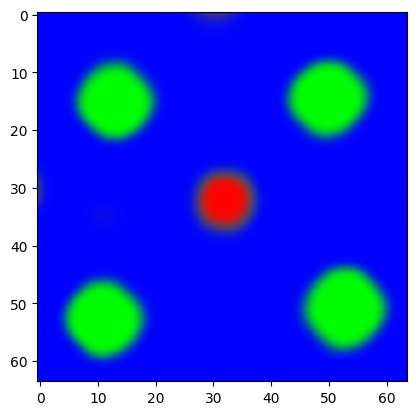

In [23]:
# Choose the effective cell size (sc = 1, 2, 3, ...)
sc = 1

d = int(0.5*(sc+1)*d0)
nb_classes = 3
img_cr_all, com_ = extract_subimages(
    network_output, com1, d, nb_classes, n = 500)
plt.imshow(img_cr_all[-1], interpolation = 'Gaussian')

### Principal component analysis (code)

We will now do principal component analysis (PCA) for different effective cell size and plot PCA scree plots as well as a variance for each of the first several PCA components for different effective cell sizes.

**Caution:** This process may take some time (up to 30 min) and require large amounts of RAM (up to 12 GB). Since it is not critical to running other code sections, you may skip it.

In [24]:
# set the min and max values of the effective unit cell
d_min = 1
d_max = 4

nb_classes = 2 # we do not consider a background class
explained_var_all = np.empty((0, 30))
for i in range(d_min, d_max+1):
    d_ = int(0.5*(i+1)*d0)
    img_cr_all, _ = extract_subimages(
        network_output, com1, d_, nb_classes)
    # Flatten the image stack
    n, w, h, ch = img_cr_all.shape
    X_vec = img_cr_all.reshape(n, w*h*ch)
    # Perform PCA
    pca = decomposition.PCA()
    pca.fit(X_vec)
    explained_var = pca.explained_variance_ratio_
    explained_var = explained_var[0:30].reshape(1, -1)
    explained_var_all = np.append(explained_var_all, explained_var, axis = 0)

Plot the results:

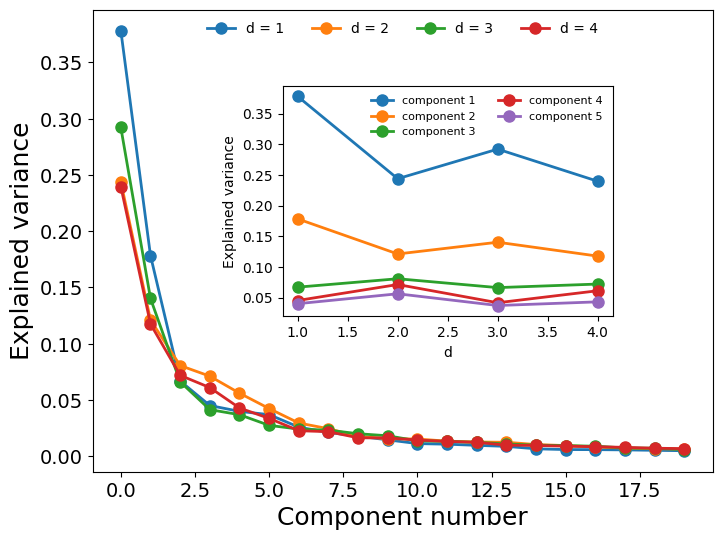

In [25]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
colors = color_list()

fig, ax = plt.subplots(1, 1, figsize=(8, 6))
axins = inset_axes(ax, 3.3, 2.3,
                   bbox_to_anchor=(0.3, 0.3, 0.55, 0.55),
                   bbox_transform=ax.transAxes)
r, xc = explained_var_all.shape
for i in range(r):
    ax.plot(np.arange(xc)[0:20], explained_var_all[i, 0:20],
            '-o', linewidth=2, markersize=8,
            label='d = '+str(i+1))
    ax.legend(loc='upper center', ncol=d_max, frameon=False)
    ax.set_xlabel('Number of components')
    ax.set_ylabel('Explained variance')
ax.set_xlabel('Component number', fontsize=18)
ax.set_ylabel('Explained variance', fontsize=18)
ax.tick_params(axis='both', labelsize=14)

for i in range(d_max+1):
    axins.plot(np.arange(r)+1, explained_var_all[:, i],
               '-o',linewidth=2,markersize=8,
               label = 'component '+str(i+1))
axins.legend(loc='best', ncol=2, fontsize=8, frameon=False)
axins.set_xlabel('d', fontsize = 10)
axins.set_ylabel('Explained variance', fontsize=10)
axins.tick_params(axis='both', labelsize=10)
fig.savefig(mdirectory+str(image_filename[0:-4])+'-PCAanalysis.png')

We will now run an exploratory analysis on the extracted image stack of the selected size (sc = 1).

In [26]:
# Choose the effective cell size
sc = 1

Prepare the data:

(*This image stack will be used for the rest of the analysis*)

In [27]:
d = int(0.5*(sc+1)*d0)
nb_classes = 2
img_cr_all, com_ = extract_subimages(
    network_output, com1, d, nb_classes)
n, w, h, ch = img_cr_all.shape
X_vec = img_cr_all.reshape(n, w*h*ch)

Here we will plot PCA eigenmodes with the associated loading maps for the selected number of PCA components:

NUMBER OF COMPONENTS: 4


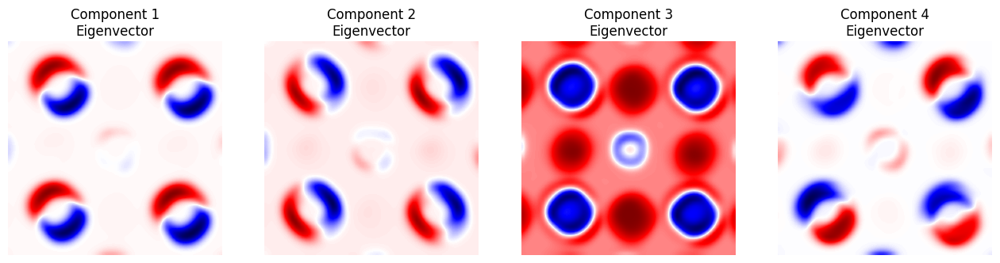

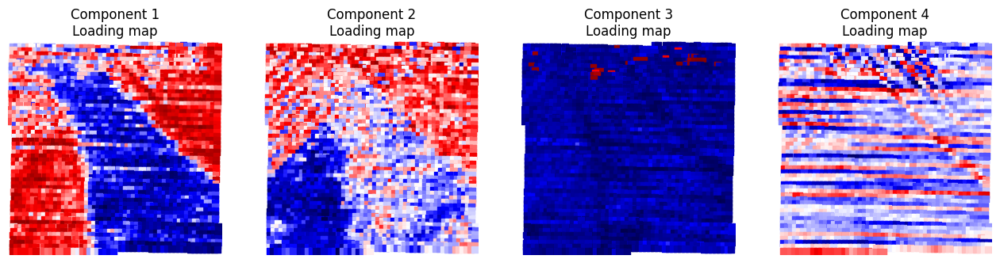

In [28]:
# specify number of components for PCA-based dimensionality reduction
nc = 4
img_w, img_h = network_output.shape[1:3]

# pca transformation
pca = decomposition.PCA(n_components=nc, random_state=42)
X_vec_t = pca.fit_transform(X_vec)
components = pca.components_
components = components.reshape(nc, w, h, ch)

rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))
y, x = com_.T

print('NUMBER OF COMPONENTS: ' + str(nc))
# plot eigenvectors
gs1 = gridspec.GridSpec(rows, cols)
fig1 = plt.figure(figsize=(4*cols, 4*(1+rows//2)))
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    ax1.imshow(components[i, :, :, 0]+components[i, :, :, 1],
               cmap='seismic', interpolation='Gaussian')
    ax1.set_aspect('equal')
    ax1.axis('off')
    ax1.set_title('Component '+str(i + 1)+'\nEigenvector')
fig1.savefig(mdirectory+str(image_filename[0:-4])+'-PCAmodes-n_cells'
             +str(sc)+'-n_components'+str(nc)+'.png')
plt.show()

#plot loading maps
gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize=(4*cols, 4*(1+rows//2)))
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.scatter(x, y, c = X_vec_t[:, i], cmap='seismic', marker='s', s=32)
    ax2.set_xlim(0, img_w)
    ax2.set_ylim(img_h, 0)
    ax2.set_aspect('equal')
    ax2.axis('off')
    ax2.set_title('Component '+str(i+1)+'\nLoading map')
fig2.savefig(mdirectory+str(image_filename[0:-4])+'-PCAmaps-n_cells-'
             +str(sc)+'-n_components'+str(nc)+'.png')
plt.show()

### k-means analysis (code)

We plot 2D plot of features associated with the first two PCA components:

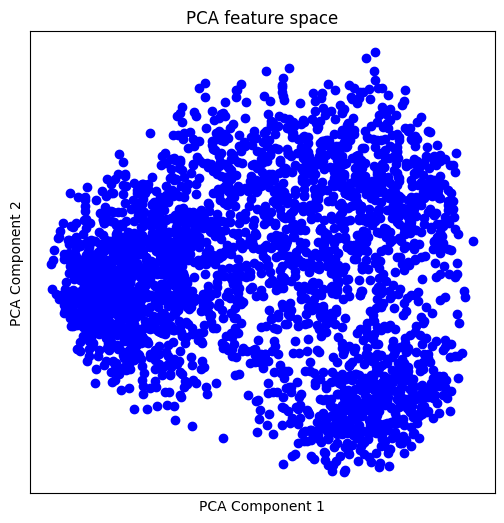

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(X_vec_t[:, 0], X_vec_t[:, 1], color='blue')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('PCA feature space')
fig.savefig(mdirectory+str(image_filename[0:-4])+
            '-PCAfeaturespace'+'-n_cells'+str(sc)+'.png')

The plot above suggests that the PCA features can be arranged into ~3 clusters. We therefore run k-means clustering on the features associated with the forst two PCA components:

In [30]:
n_clust = 3
clf = cluster.KMeans(
        n_clusters=n_clust, random_state=10).fit(X_vec_t[:, 0:2])
x, y = clf.cluster_centers_.T
labels = clf.predict(X_vec_t[:, 0:2])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


We can plot the cluster centroids on top of PCA feature plot:

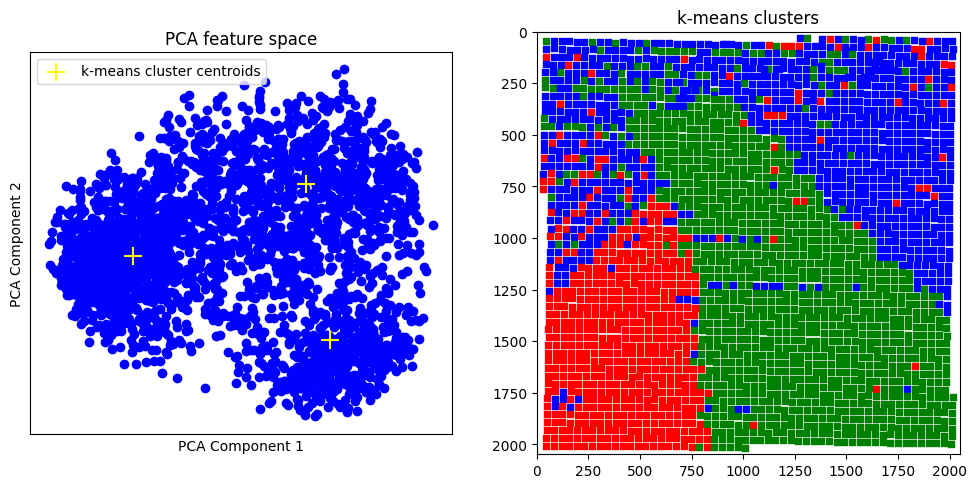

In [31]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 6))
img_w, img_h = network_output.shape[1:3]
colors = color_list()
ax1.scatter(X_vec_t[:, 0], X_vec_t[:, 1], color = 'blue')
ax1.scatter(x, y, marker='+',s=160, c='yellow', label='k-means cluster centroids')
ax1.set_aspect('equal')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title('PCA feature space')
ax1.legend()
for k in range(com_.shape[0]):
    ax2.scatter(com_[k][1], com_[k][0],
               c = colors[labels[k]],
               marker='s', s=24)
    ax2.set_xlim(0, img_w)
    ax2.set_ylim(img_h, 0)
ax2.set_aspect('equal')
ax2.set_title('k-means clusters')
fig.savefig(mdirectory+str(image_filename[0:-4])+'-KMeans_on_PCA-n_clusters'
            +str(n_clust)+'-n_PCAcomponents'+str(nc)+'-n_cells'+str(sc)+'.png')

### Non-Negative Matrix Factorization (code)

We next use a non-negative matrix factorization (NMF), which separates the mixture in non-negative components, corresponding to positive intensities for the image. Below we will run NMF for different total number of components and display the "endmembers" with the associated loading maps:

NUMBER OF COMPONENTS: 3


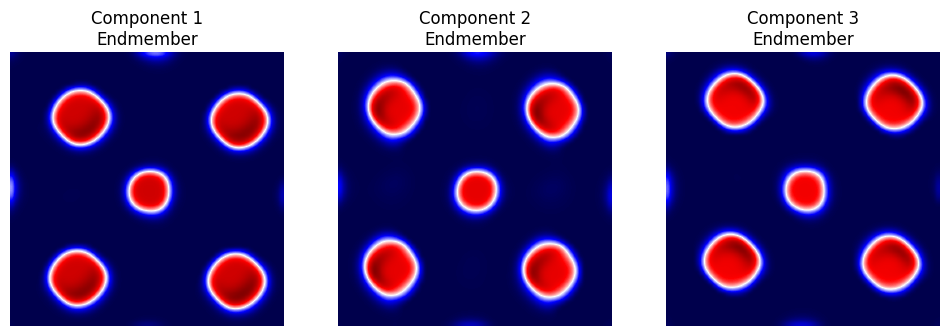

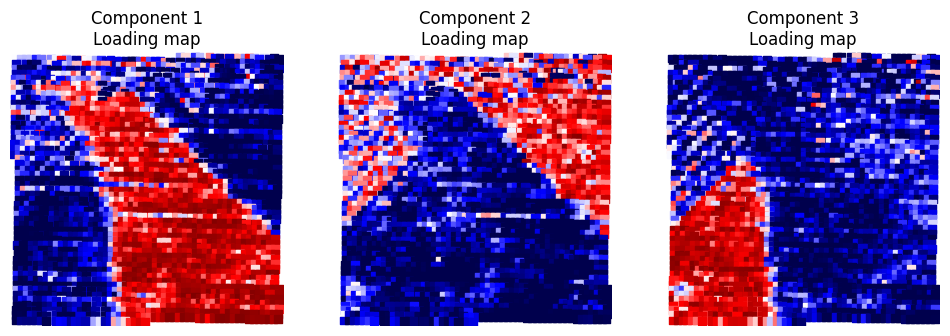

NUMBER OF COMPONENTS: 4


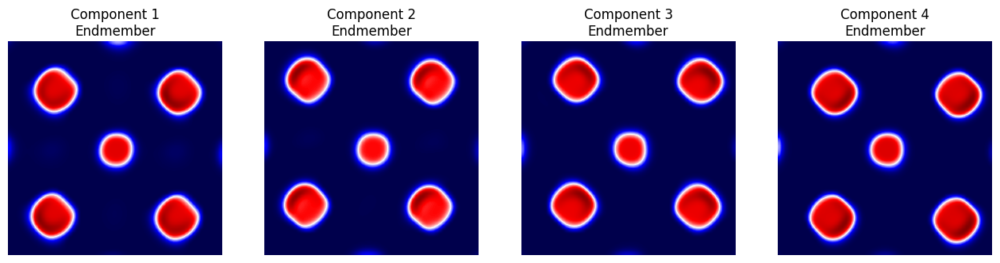

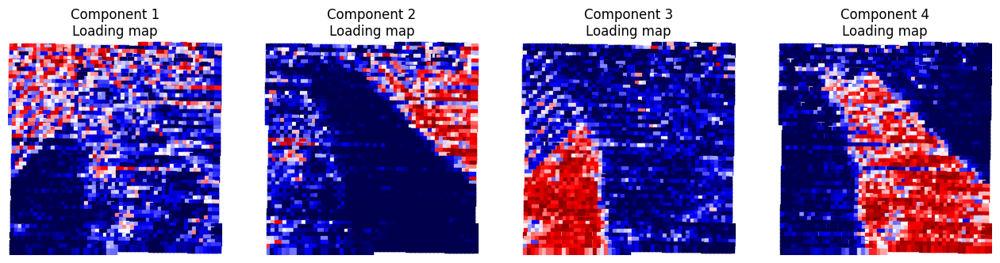

NUMBER OF COMPONENTS: 5


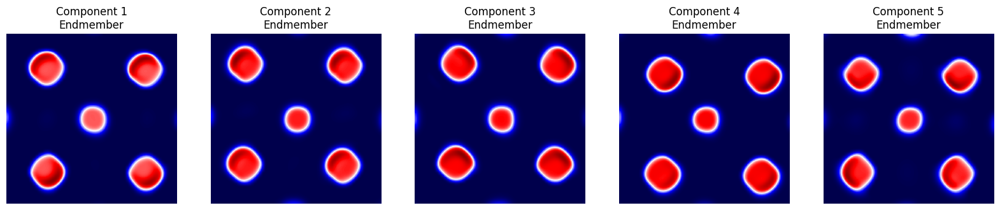

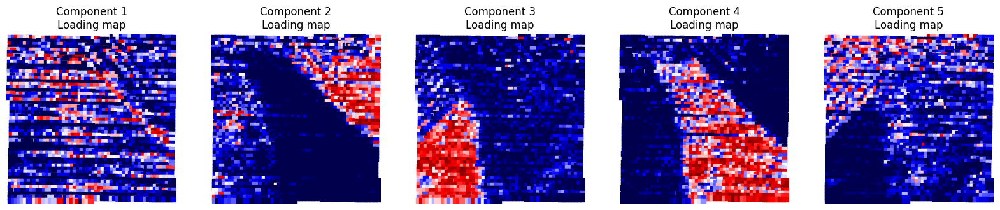

NUMBER OF COMPONENTS: 6


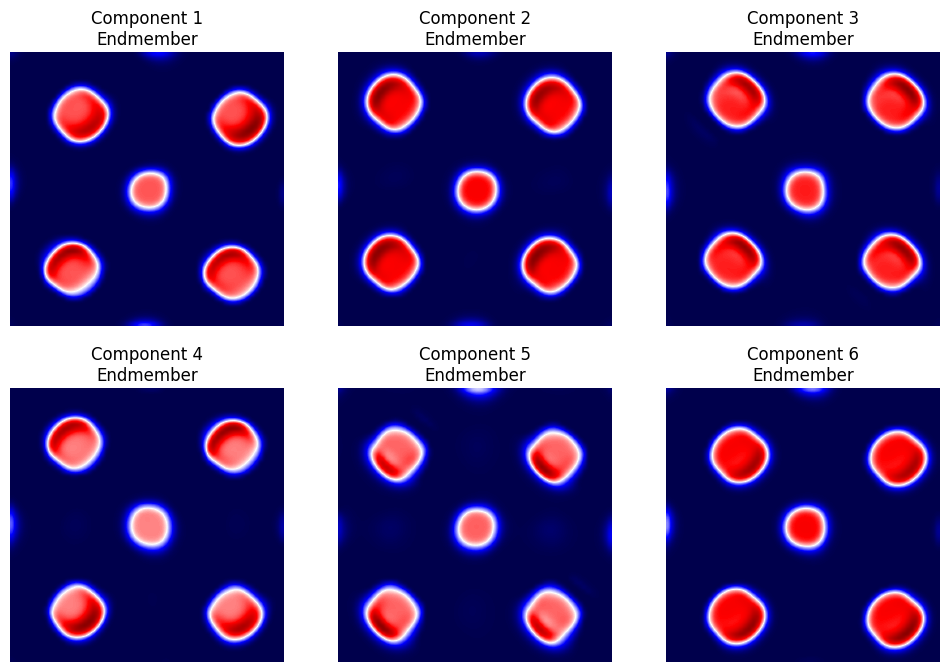

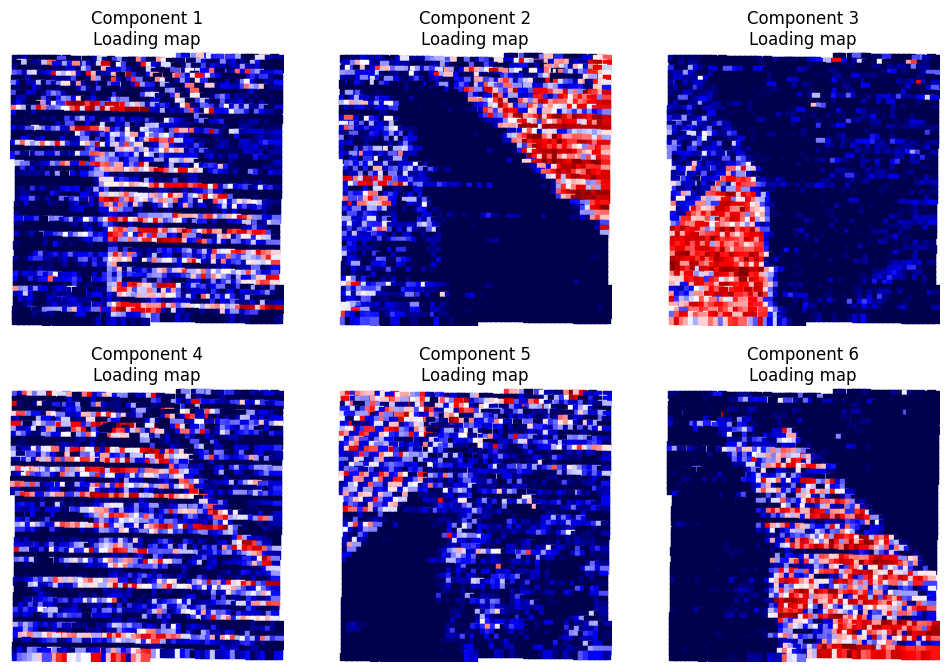

NUMBER OF COMPONENTS: 7


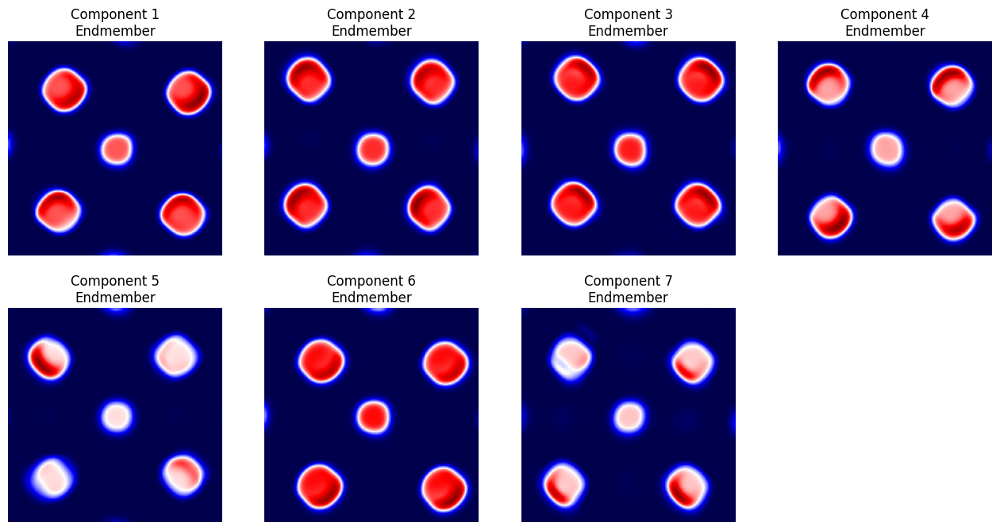

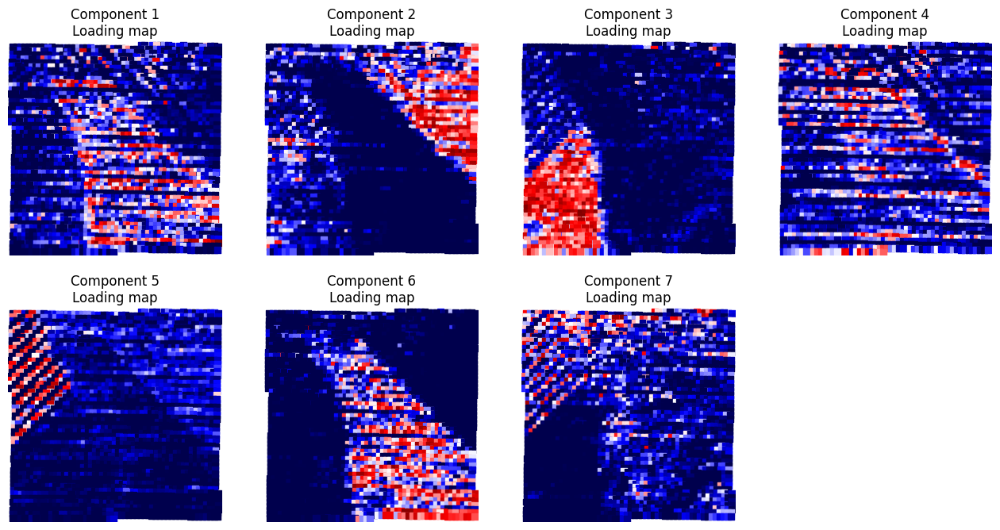

NUMBER OF COMPONENTS: 8


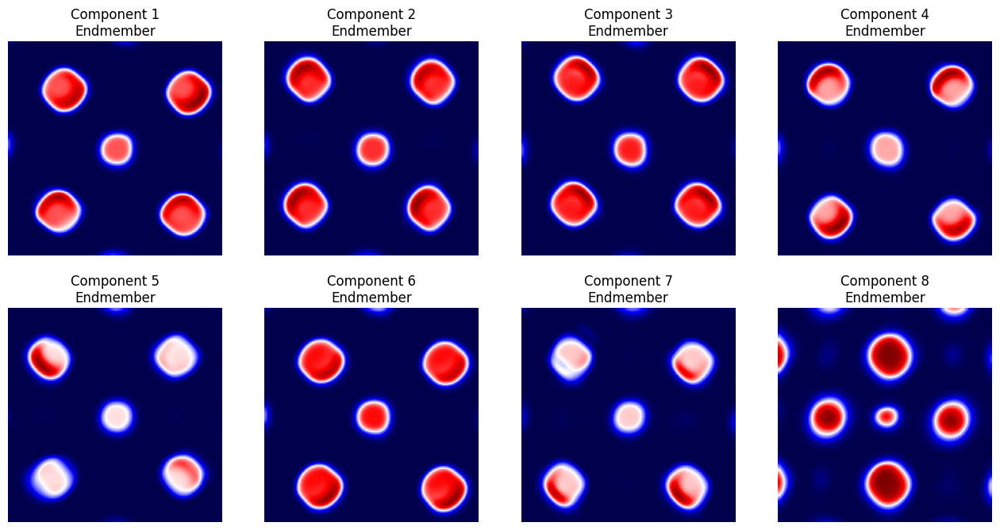

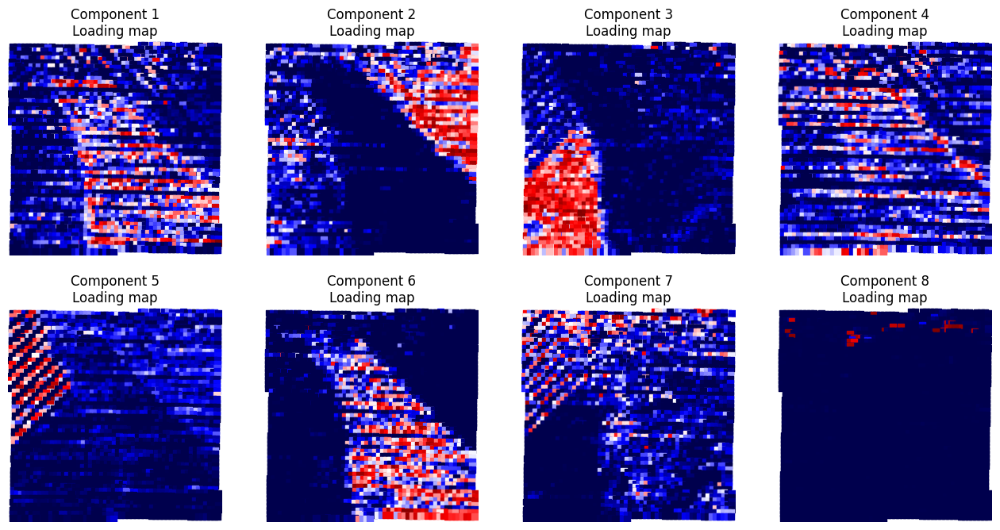

In [32]:
components_total = [3, 4, 5, 6, 7, 8]
img_w, img_h = network_output.shape[1:3]

for nc in components_total:
    # run nmf analysis
    nmf = decomposition.NMF(
        n_components = nc, random_state=42, max_iter=1000)
    X_vec_t = nmf.fit_transform(X_vec)
    components = nmf.components_
    components = components.reshape(nc, w, h, ch)

    rows = int(np.ceil(float(nc)/5))
    cols = int(np.ceil(float(nc)/rows))
    y, x = com_.T

    print('NUMBER OF COMPONENTS: ' + str(nc))
    # plot extracted endmembers
    gs1 = gridspec.GridSpec(rows, cols)
    fig1 = plt.figure(figsize=(4*cols, 4*(1+rows//2)))
    for i in range(nc):
        ax1 = fig1.add_subplot(gs1[i])
        ax1.imshow(components[i,:, :, 0]+components[i, :, :, 1],
                   cmap='seismic', interpolation='Gaussian')
        ax1.set_aspect('equal')
        ax1.axis('off')
        ax1.set_title('Component '+str(i+1)+'\nEndmember')
    fig1.savefig(mdirectory+str(image_filename[0:-4])+'-NMFmodes-n_cells'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()

    # plot loading maps
    gs2 = gridspec.GridSpec(rows, cols)
    fig2 = plt.figure(figsize=(4*cols, 4*(1+rows//2)))
    for i in range(nc):
        ax2 = fig2.add_subplot(gs2[i])
        ax2.scatter(x, y, c=X_vec_t[:,i], cmap='seismic', marker='s', s=32)
        ax2.set_xlim(0, img_w)
        ax2.set_ylim(img_h, 0)
        ax2.set_aspect('equal')
        ax2.axis('off')
        ax2.set_title('Component '+str(i + 1)+'\nLoading map')
    fig2.savefig(mdirectory+str(image_filename[0:-4])+'-NMFmaps-n_cells-'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()

### Independent component analysis (code)

We run the independent component analysis (ICA) on the same set of data and display eigenvectors with the associated loading maps:

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


NUMBER OF COMPONENTS: 3


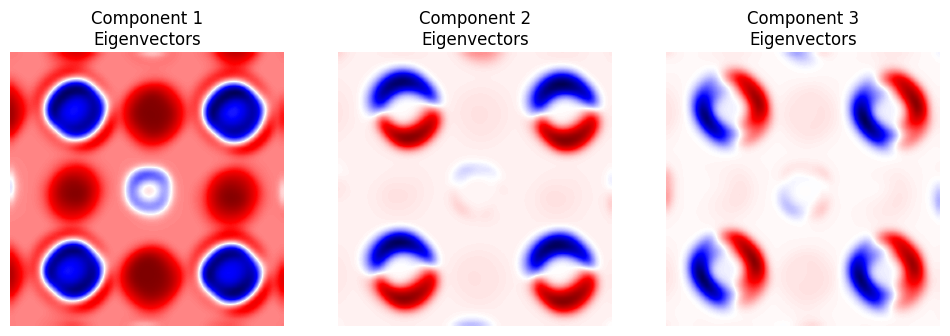

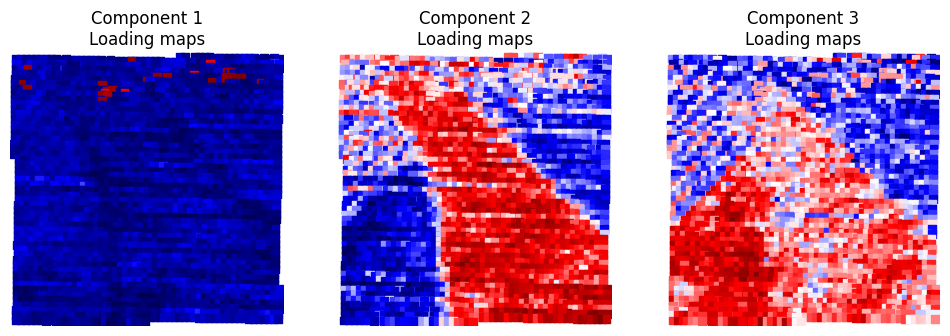

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


NUMBER OF COMPONENTS: 4


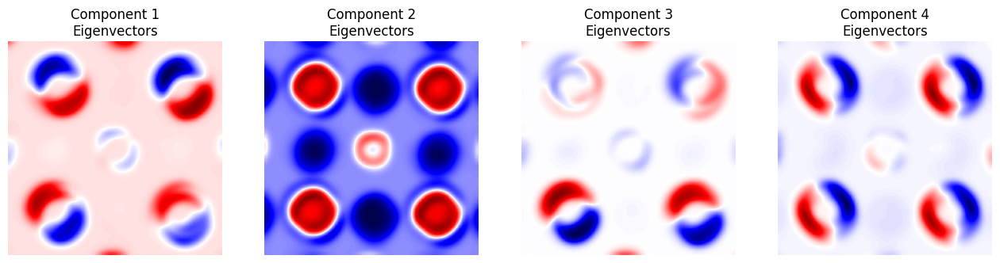

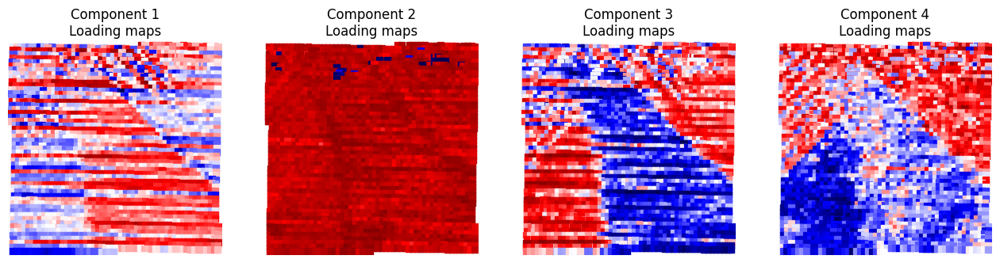

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


NUMBER OF COMPONENTS: 5


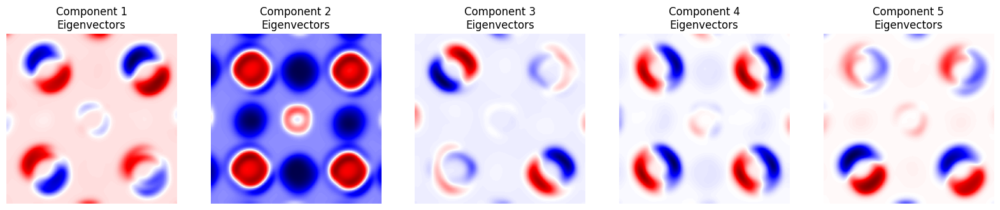

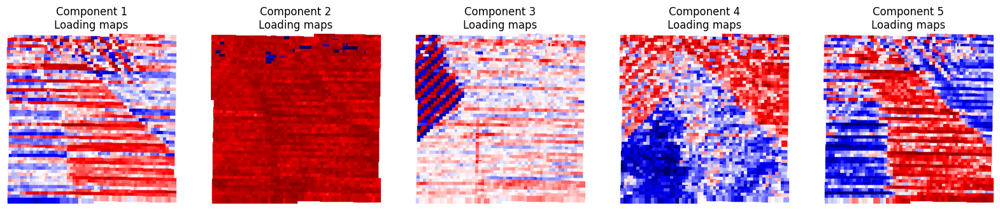

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


NUMBER OF COMPONENTS: 6


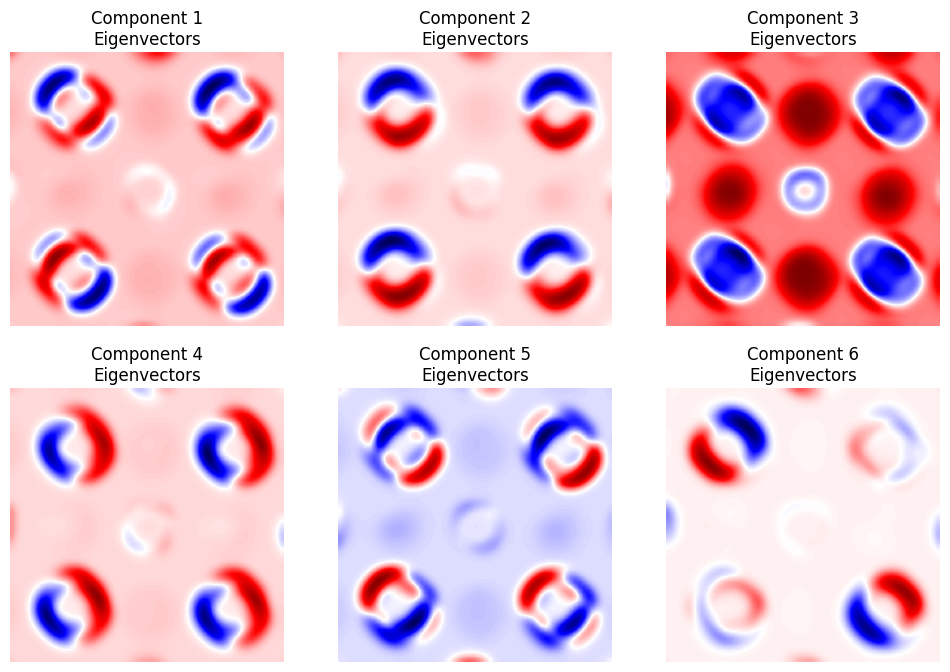

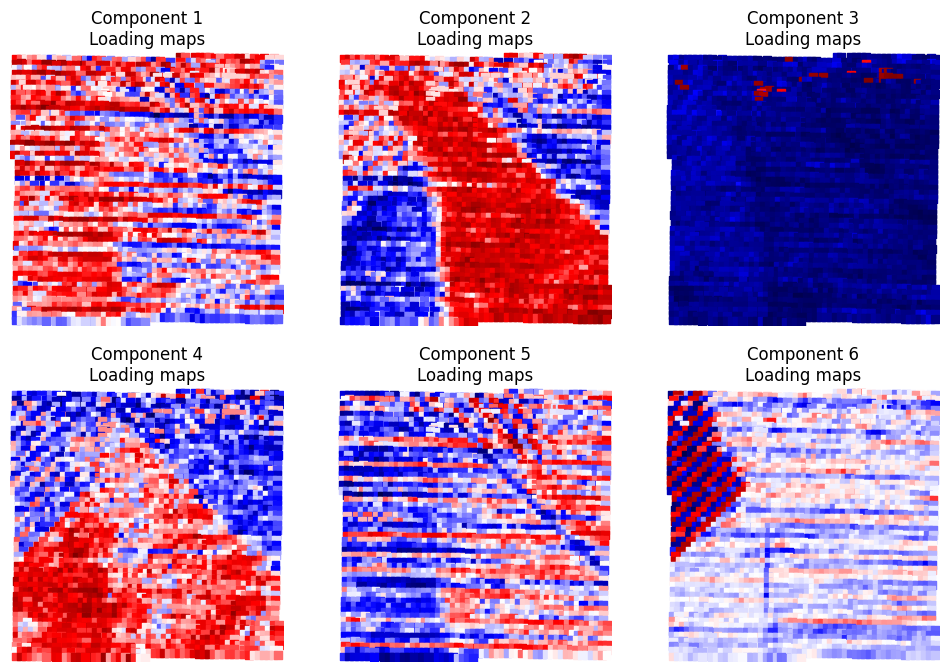

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


NUMBER OF COMPONENTS: 7


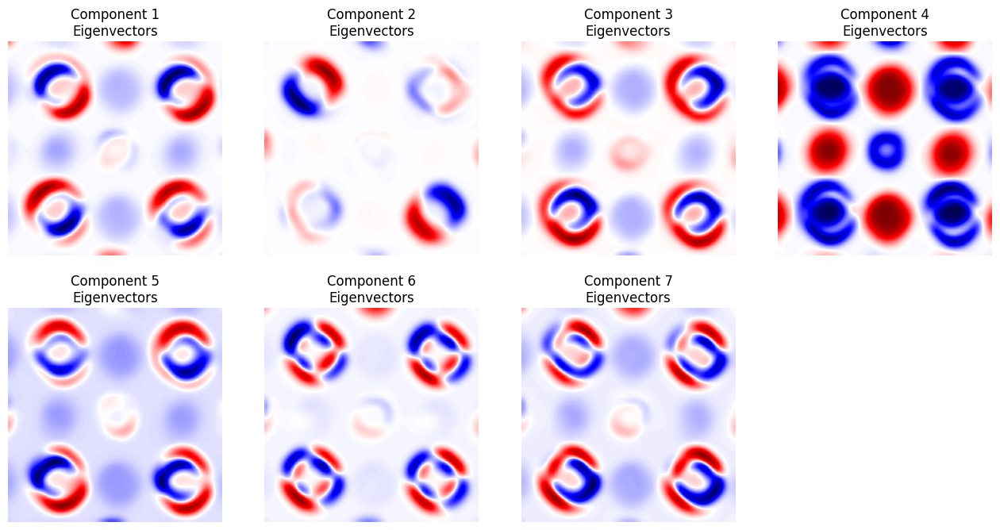

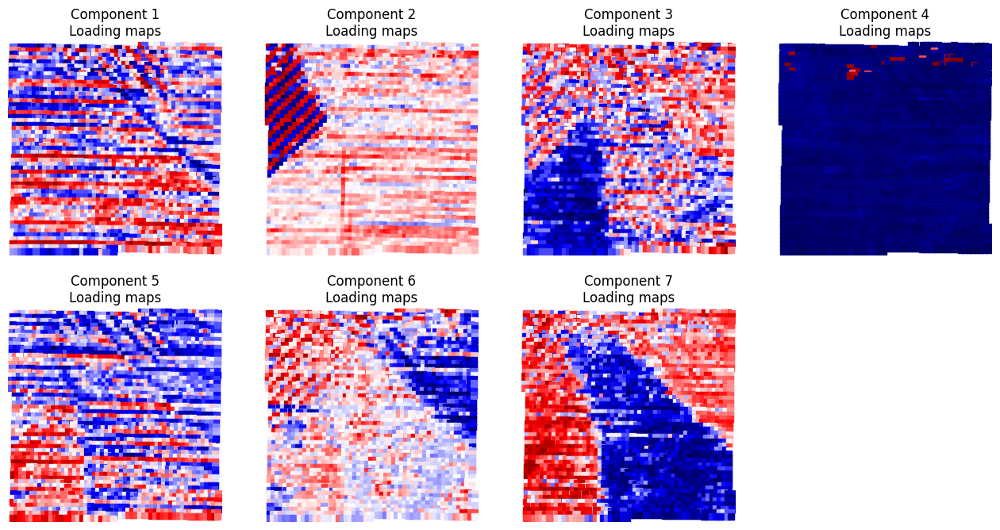

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


NUMBER OF COMPONENTS: 8


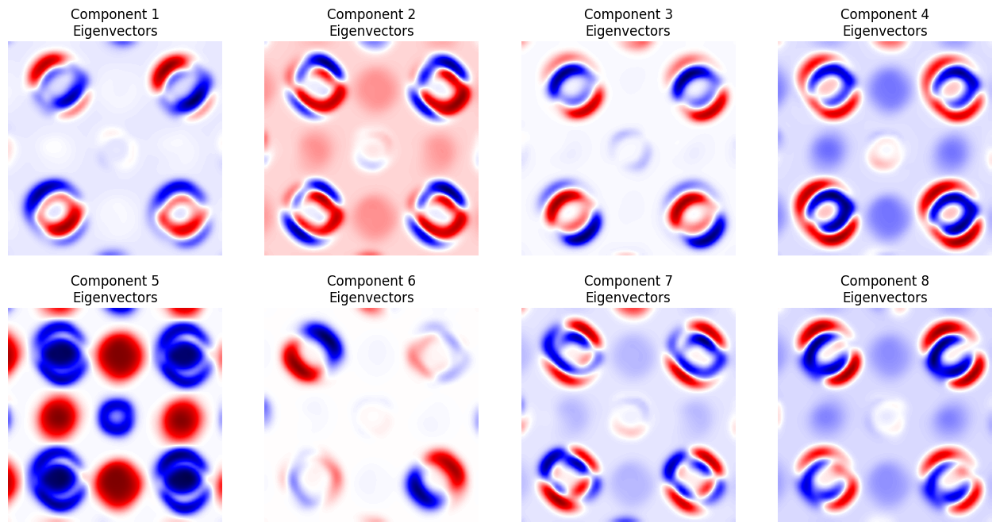

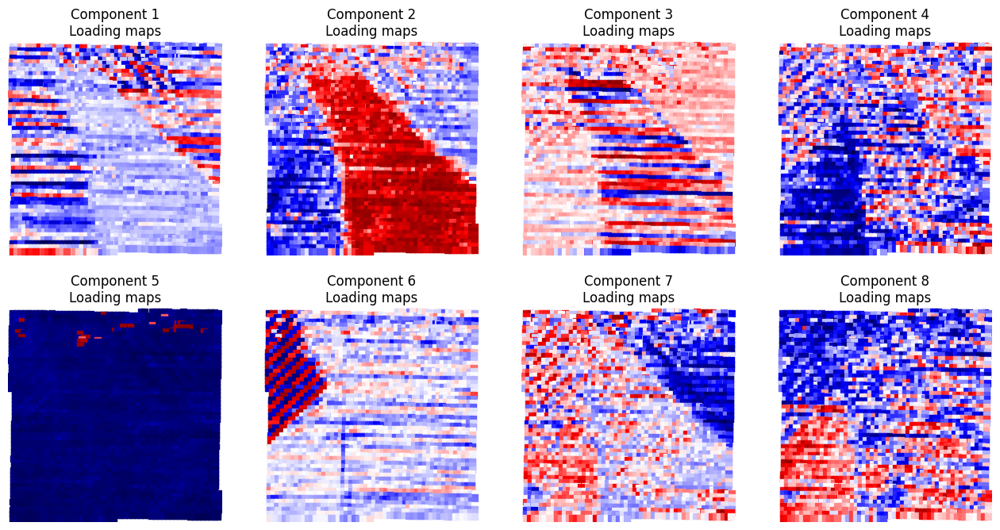

In [33]:
components_total = [3, 4, 5, 6, 7, 8]
img_w, img_h = network_output.shape[1:3]

for nc in components_total:
    # run ica analysis
    ica = decomposition.FastICA(
        n_components = nc, random_state=42, max_iter=1000)
    X_vec_t = ica.fit_transform(X_vec)
    components = ica.components_
    components = components.reshape(nc, w, h, ch)

    rows = int(np.ceil(float(nc)/5))
    cols = int(np.ceil(float(nc)/rows))
    y, x = com_.T

    print('NUMBER OF COMPONENTS: ' + str(nc))
    # plot ica eigenvectors
    gs1 = gridspec.GridSpec(rows, cols)
    fig1 = plt.figure(figsize=(4*cols, 4*(1+rows//2)))
    for i in range(nc):
        ax1 = fig1.add_subplot(gs1[i])
        ax1.imshow(components[i, :, :, 0]+components[i, :, :, 1],
                   cmap='seismic', interpolation='Gaussian')
        ax1.set_aspect('equal')
        ax1.axis('off')
        ax1.set_title('Component ' + str(i + 1) + '\nEigenvectors')
    fig1.savefig(mdirectory+str(image_filename[0:-4])+'-ICAmodes-n_cells'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()

    # plot loading maps
    gs2 = gridspec.GridSpec(rows, cols)
    fig2 = plt.figure(figsize=(4*cols, 4*(1+rows//2)))
    for i in range(nc):
        ax2 = fig2.add_subplot(gs2[i])
        ax2.scatter(x, y, c=X_vec_t[:,i], cmap='seismic', marker='s', s=32)
        ax2.set_xlim(0, img_w)
        ax2.set_ylim(img_h, 0)
        ax2.set_aspect('equal')
        ax2.axis('off')
        ax2.set_title('Component '+str(i + 1)+'\nLoading maps')
    fig2.savefig(mdirectory+str(image_filename[0:-4])+'-ICAmaps-n_cells-'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()

### Gaussian mixture model (code)

Finally, we will apply a Gaussian mixture model to our dataset and plot the means of the extracted mixture components and the corresponding abundance (loading) maps:

NUMBER OF COMPONENTS: 3


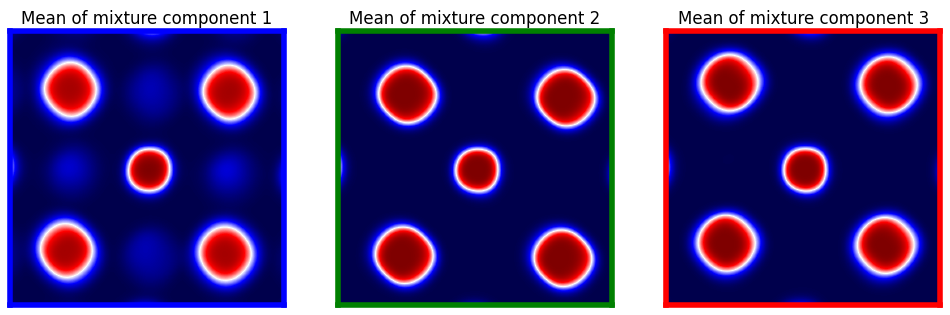

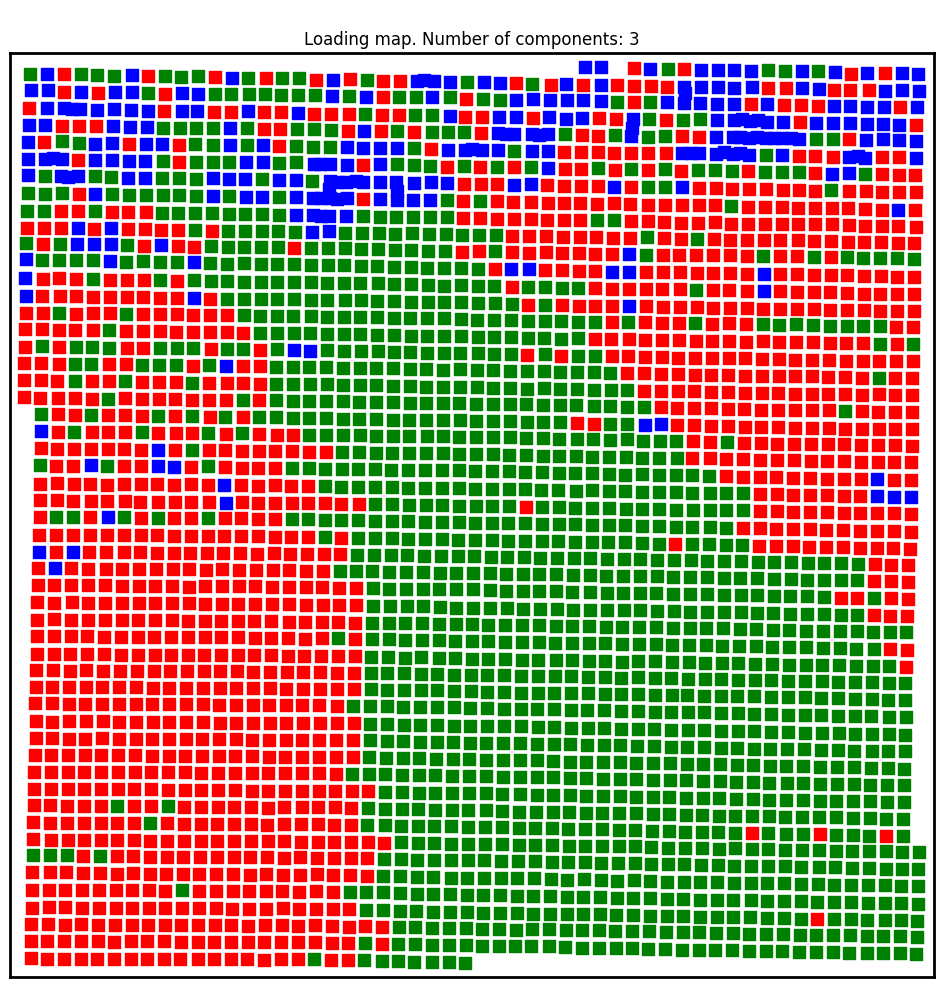

NUMBER OF COMPONENTS: 4


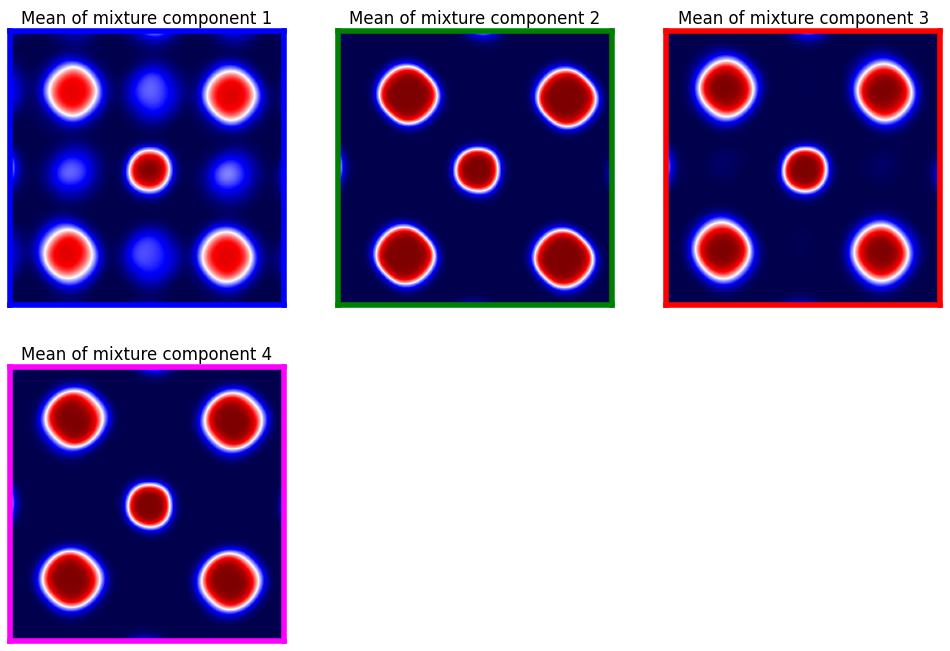

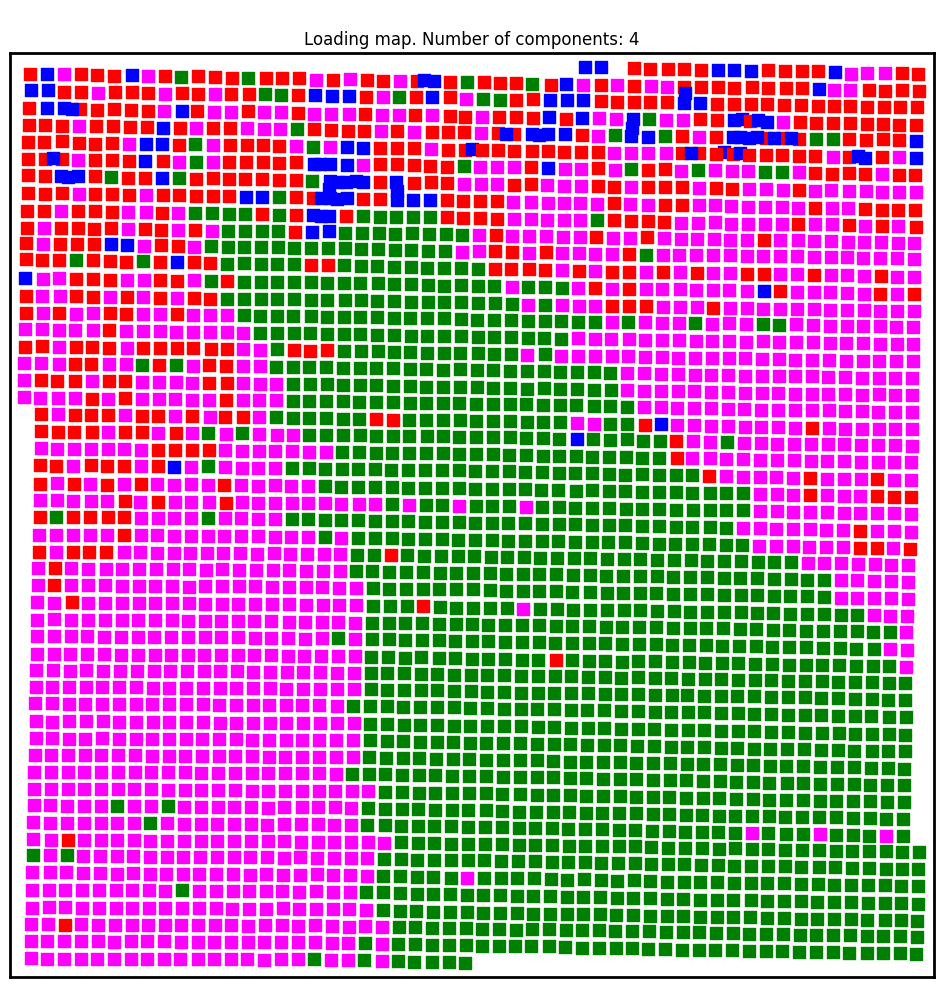

NUMBER OF COMPONENTS: 5


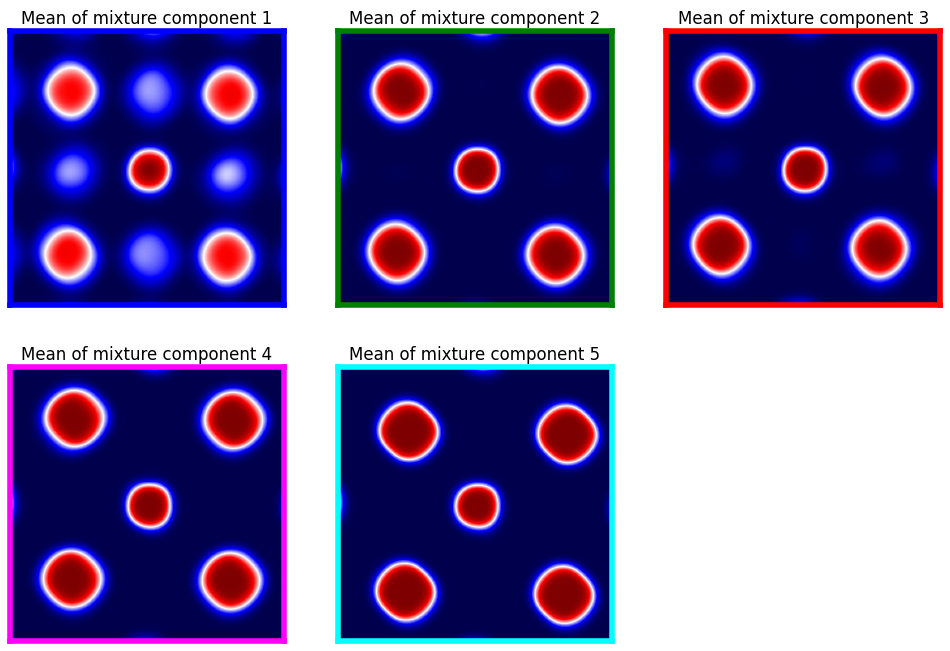

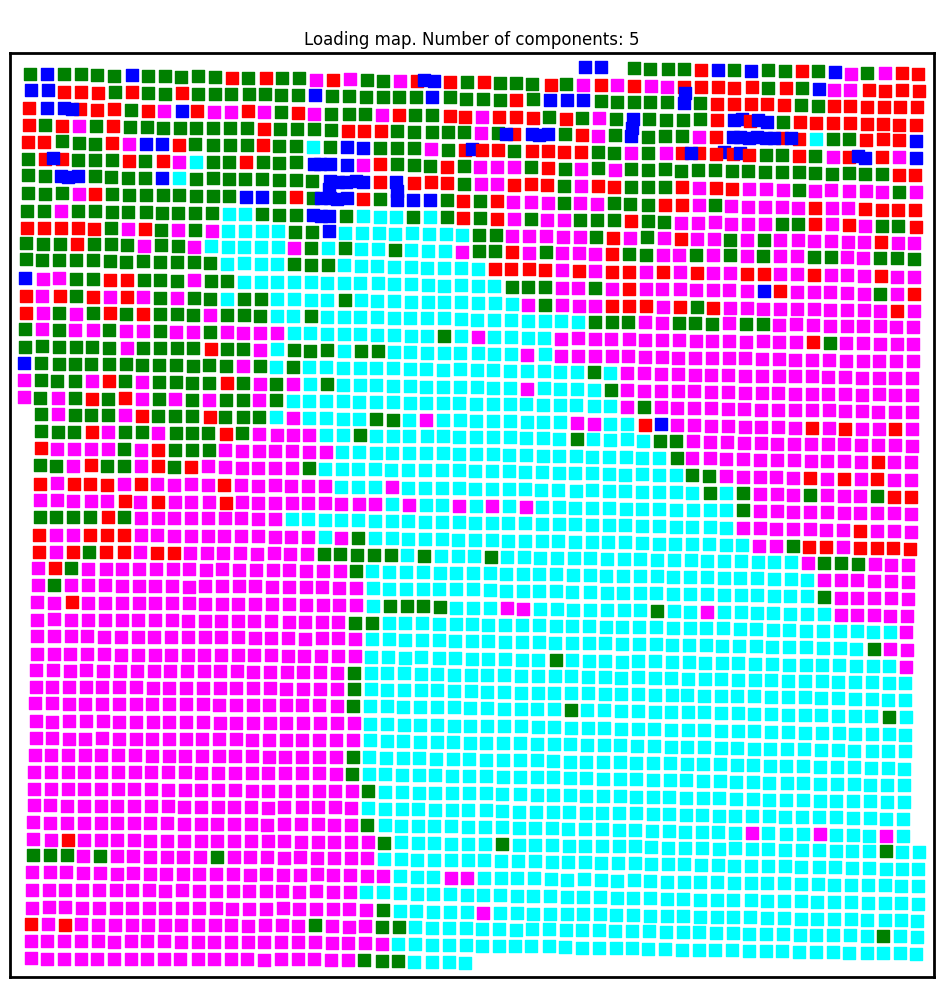

NUMBER OF COMPONENTS: 6


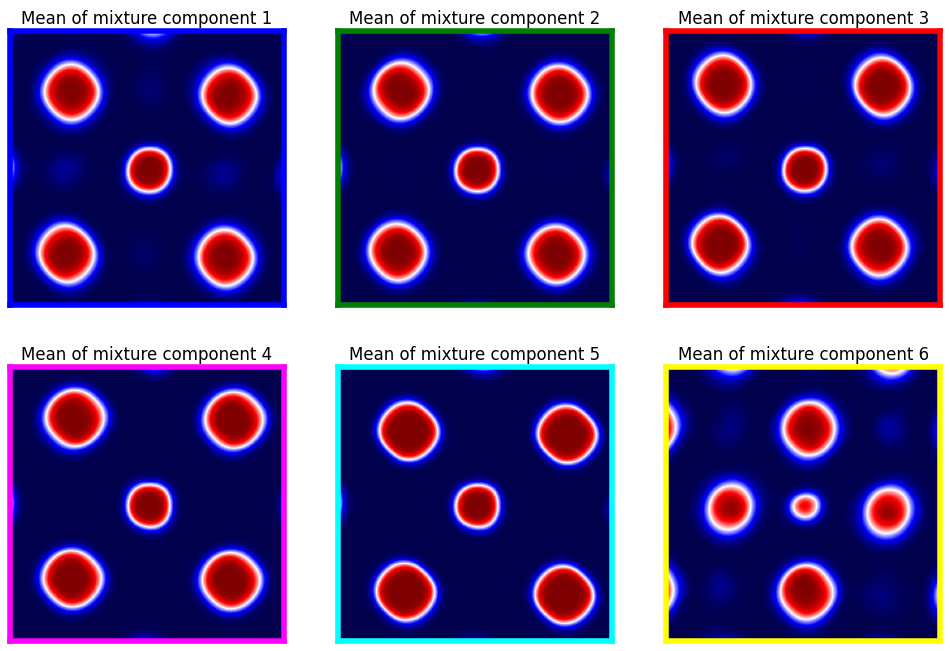

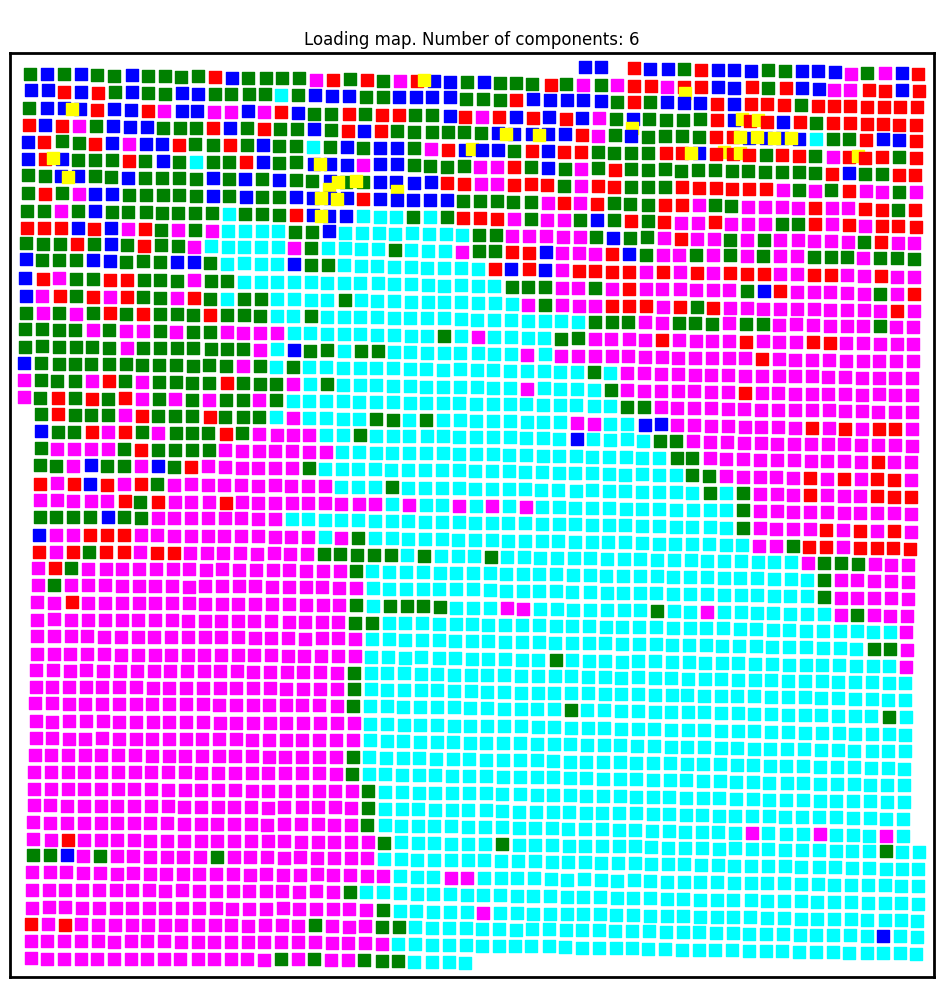

NUMBER OF COMPONENTS: 7


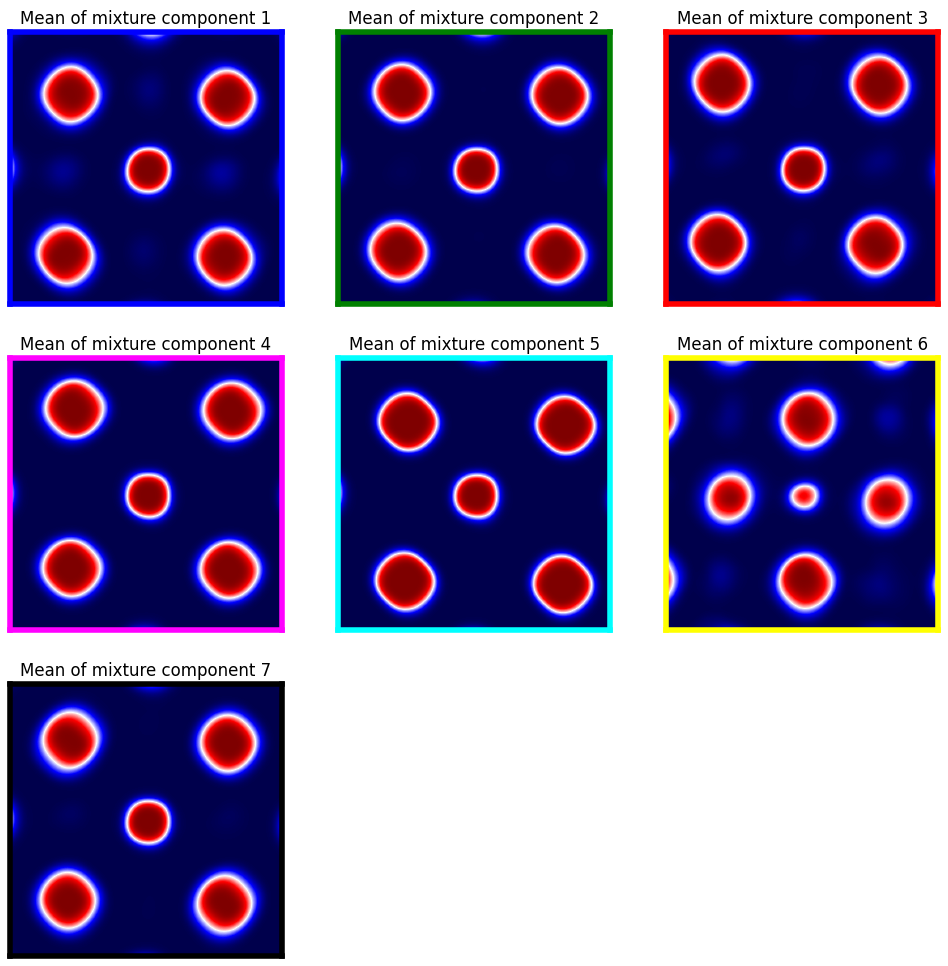

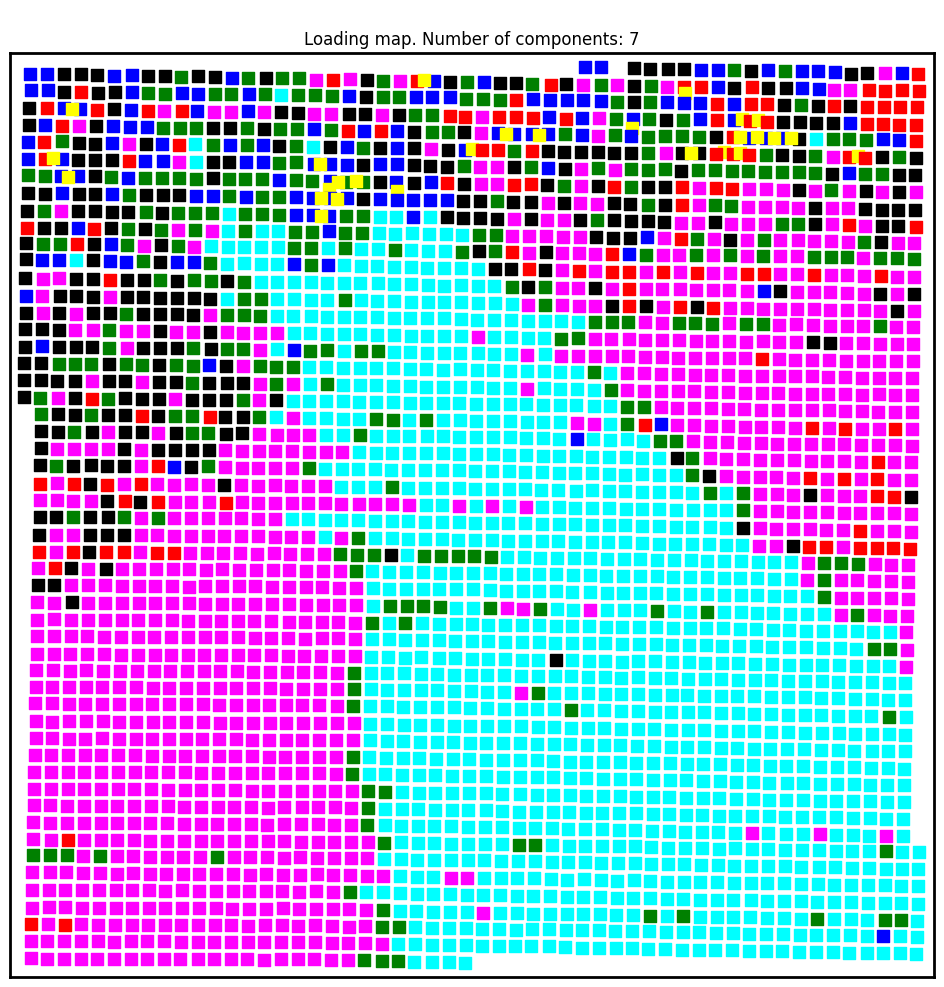

NUMBER OF COMPONENTS: 8


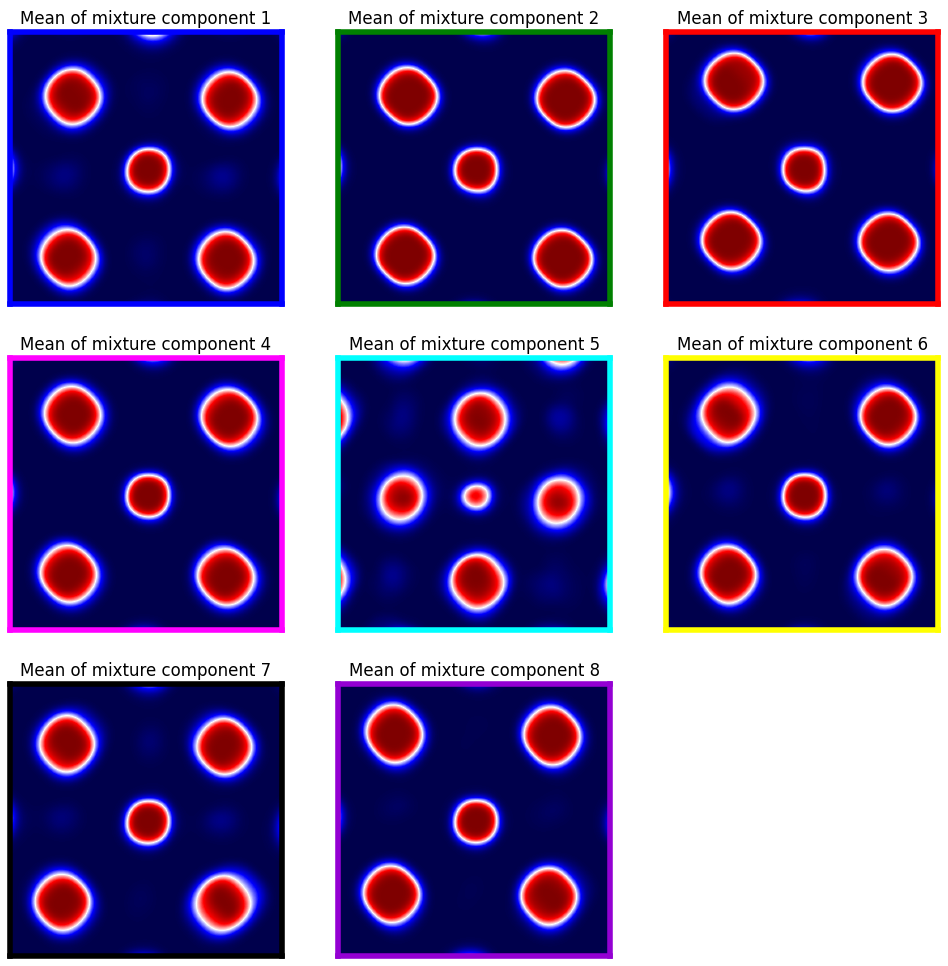

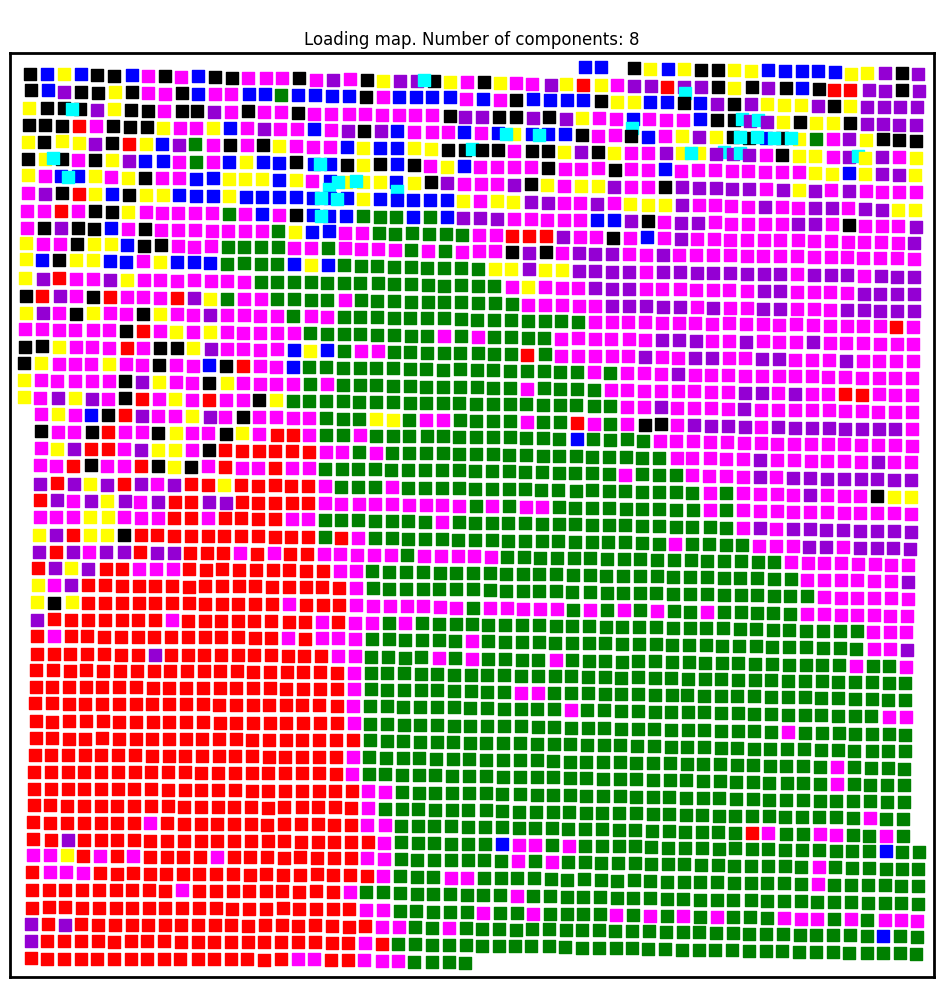

In [34]:
clusters = [3, 4, 5, 6, 7, 8]
img_w, img_h = network_output.shape[1:3]
colors = color_list()

for nc in clusters:
    # GMM analysis: fit the "training data"
    clf = mixture.GaussianMixture(
        n_components=nc, covariance_type='diag',
        random_state=10).fit(X_vec)
    # predict class of each sample in the dataset
    labels = clf.predict(X_vec)
    # find means of the mixture centroids
    means = clf.means_
    means = means.reshape(nc, w, h, ch)

    cols = 3
    rows = int(np.ceil(float(nc/cols)))
    y, x = com_.T

    print('NUMBER OF COMPONENTS: ' + str(nc))
    # plot the extracted centroid means
    gs1 = gridspec.GridSpec(rows, cols)
    fig1 = plt.figure(figsize=(4*cols, 4*rows))
    for idx, img in enumerate(means):
        ax1 = fig1.add_subplot(gs1[idx])
        ax1.imshow(img[:, :, 0]+img[:, :, 1],
                   cmap='seismic', interpolation='Gaussian')
        ax1.set_title('Mean of mixture component '+str(idx+1))
        ax1.tick_params(color=colors[idx], labelcolor=colors[idx])
        for spine in ax1.spines.values():
            spine.set_edgecolor(colors[idx])
            spine.set_linewidth(4)
        ax1.grid(False)
        ax1.set_xticks([])
        ax1.set_yticks([])
    fig1.savefig(mdirectory+str(image_filename[0:-4])+'-GMMmeans-n_cells'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()

    # plot the correspondong abundance maps
    fig, ax2 = plt.subplots(1, 1, figsize=(4*cols, 4*cols))
    for k in range(com_.shape[0]):
        ax2.scatter(com_[k][1], com_[k][0],
                    c = colors[labels[k]], marker='s', s=64)
    ax2.set_xlim(0, img_w)
    ax2.set_ylim(img_h, 0)
    ax2.set_aspect('equal')
    ax2.set_title('\nLoading map. Number of components: '+str(nc))
    for spine in ax2.spines.values():
            spine.set_edgecolor('black')
            spine.set_linewidth(2)
            ax2.grid(False)
            ax2.set_xticks([])
            ax2.set_yticks([])
    fig2.savefig(mdirectory+str(image_filename[0:-4])+
                 '-GMMmap-n_cells-'+'-n_components'+str(nc)
                 +str(sc)+'.png')
    plt.show()

# Conclusions (text)

To summarize, we have developed the approach for the bottom-up construction of the individual structural elements of the ferroelectric solid. This approach allows for the separation of the components averaged in the beam direction, and provides the way to efficiently work with such data. The anomalous behaviors at the ferroelectric domain walls were detected. The data analysis tools developed in this work are available in the form of the open Google Colab notebook and can be used across the STEM and ferroelectric community.

# Acknowledgements (text)
The concept of the Jupyter-based publications is proposed and developed by MZ, RKV, and SVK. Research was supported by the U.S. Department of Energy, Office of Science, Basic Energy Sciences, Materials Sciences and Engineering Division (SVK, CN). This research was conducted at the Center for Nanophase Materials Sciences and is a DOE Office of Science User Facility. Electron microscopy at the Molecular Foundry, Lawrence Berkeley National Laboratory, was supported by the U.S. Department of Energy, Office of Science, Office of Basic Energy Sciences under contract # DE-AC02-05CD11231.

# References (text)

1.	Damjanovic, D., Ferroelectric, dielectric and piezoelectric properties of ferroelectric thin films and ceramics. Rep. Prog. Phys. 1998, 61 (9), 1267-1324.
2.	Auciello, O.;  Scott, J. F.; Ramesh, R., The physics of ferroelectric memories. Phys. Today 1998, 51 (7), 22-27.
3.	Alexe, M.;  Gruverman, A.;  Harnagea, C.;  Zakharov, N. D.;  Pignolet, A.;  Hesse, D.; Scott, J. F., Switching properties of self-assembled ferroelectric memory cells. Appl. Phys. Lett. 1999, 75 (8), 1158-1160.
4.	Setter, N.;  Damjanovic, D.;  Eng, L.;  Fox, G.;  Gevorgian, S.;  Hong, S.;  Kingon, A.;  Kohlstedt, H.;  Park, N. Y.;  Stephenson, G. B.;  Stolitchnov, I.;  Tagantsev, A. K.;  Taylor, D. V.;  Yamada, T.; Streiffer, S., Ferroelectric thin films: Review of materials, properties, and applications. Journal of Applied Physics 2006, 100 (5).
5.	A.K. Tagantsev, L. E. C., and J. Fousek, Domains in Ferroic Crystals and Thin Films. Springer: New York, 2010.
6.	Glazounov, A. E.;  Tagantsev, A. K.; Bell, A. J., Evidence for domain-type dynamics in the ergodic phase of the PbMg1/3Nb2/3O3 relaxor ferroelectric. Physical Review B 1996, 53 (17), 11281-11284.
7.	Bokov, A. A.;  Rodriguez, B. J.;  Zhao, X. H.;  Ko, J. H.;  Jesse, S.;  Long, X. F.;  Qu, W. G.;  Kim, T. H.;  Budai, J. D.;  Morozovska, A. N.;  Kojima, S.;  Tan, X. L.;  Kalinin, S. V.; Ye, Z. G., Compositional disorder, polar nanoregions and dipole dynamics in Pb(Mg(1/3)Nb(2/3))O(3)-based relaxor ferroelectrics. Zeitschrift Fur Kristallographie 2011, 226 (2), 99-107.
8.	Yang, S. M.;  Morozovska, A. N.;  Kumar, R.;  Eliseev, E. A.;  Cao, Y.;  Mazet, L.;  Balke, N.;  Jesse, S.;  Vasudevan, R. K.;  Dubourdieu, C.; Kalinin, S. V., Mixed electrochemical-ferroelectric states in nanoscale ferroelectrics. Nat. Phys. 2017, 13 (8), 812-+.
9.	Maksymovych, P.;  Jesse, S.;  Yu, P.;  Ramesh, R.;  Baddorf, A. P.; Kalinin, S. V., Polarization Control of Electron Tunneling into Ferroelectric Surfaces. Science 2009, 324 (5933), 1421-1425.
10.	Kholkin, A. L.;  Iakovlev, S. O.; Baptista, J. L., Direct effect of illumination on ferroelectric properties of lead zirconate titanate thin films. Appl. Phys. Lett. 2001, 79 (13), 2055-2057.
11.	Vasudevan, R. K.;  Marincel, D.;  Jesse, S.;  Kim, Y.;  Kumar, A.;  Kalinin, S. V.; Trolier-McKinstry, S., Polarization Dynamics in Ferroelectric Capacitors: Local Perspective on Emergent Collective Behavior and Memory Effects. Advanced Functional Materials 2013, 23 (20), 2490-2508.
12.	Kalinin, S. V.;  Morozovska, A. N.;  Chen, L. Q.; Rodriguez, B. J., Local polarization dynamics in ferroelectric materials. Reports on Progress in Physics 2010, 73 (5), 056502.
13.	Gruverman, A.; Kholkin, A., Nanoscale ferroelectrics: processing, characterization and future trends. Reports on Progress in Physics 2006, 69 (8), 2443-2474.
14.	Bonnell, D. A.;  Kalinin, S. V.;  Kholkin, A. L.; Gruverman, A., Piezoresponse Force Microscopy: A Window into Electromechanical Behavior at the Nanoscale. Mrs Bulletin 2009, 34 (9), 648-657.
15.	Rodriguez, B. J.;  Choudhury, S.;  Chu, Y. H.;  Bhattacharyya, A.;  Jesse, S.;  Seal, K.;  Baddorf, A. P.;  Ramesh, R.;  Chen, L. Q.; Kalinin, S. V., Unraveling Deterministic Mesoscopic Polarization Switching Mechanisms: Spatially Resolved Studies of a Tilt Grain Boundary in Bismuth Ferrite. Advanced Functional Materials 2009, 19 (13), 2053-2063.
16.	Rodriguez, B. J.;  Chu, Y. H.;  Ramesh, R.; Kalinin, S. V., Ferroelectric domain wall pinning at a bicrystal grain boundary in bismuth ferrite. Appl. Phys. Lett. 2008, 93 (14).
17.	Winarski, R. P.;  Holt, M. V.;  Rose, V.;  Fuesz, P.;  Carbaugh, D.;  Benson, C.;  Shu, D. M.;  Kline, D.;  Stephenson, G. B.;  McNulty, I.; Maser, J., A hard X-ray nanoprobe beamline for nanoscale microscopy. J. Synchrot. Radiat. 2012, 19, 1056-1060.
18.	Jia, C.-L.;  Nagarajan, V.;  He, J.-Q.;  Houben, L.;  Zhao, T.;  Ramesh, R.;  Urban, K.; Waser, R., Unit-cell scale mapping of ferroelectricity and tetragonality in epitaxial ultrathin ferroelectric films. Nat. Mater. 2007, 6 (1), 64-69.
19.	Chisholm, M. F.;  Luo, W.;  Oxley, M. P.;  Pantelides, S. T.; Lee, H. N., Atomic-scale compensation phenomena at polar interfaces. Phys. Rev. Lett. 2010, 105 (19), 197602.
20.	Borisevich, A.;  Ovchinnikov, O. S.;  Chang, H. J.;  Oxley, M. P.;  Yu, P.;  Seidel, J.;  Eliseev, E. A.;  Morozovska, A. N.;  Ramesh, R.;  Pennycook, S. J.; Kalinin, S. V., Mapping octahedral tilts and polarization across a domain wall in BiFeO3 from Z-contrast scanning transmission electron microscopy image atomic column shape analysis. ACS Nano 2010, 4 (10), 6071-6079.
21.	Nelson, C. T.;  Winchester, B.;  Zhang, Y.;  Kim, S.-J.;  Melville, A.;  Adamo, C.;  Folkman, C. M.;  Baek, S.-H.;  Eom, C.-B.;  Schlom, D. G.;  Chen, L.-Q.; Pan, X., Spontaneous vortex nanodomain arrays at ferroelectric heterointerfaces. Nano Lett. 2011, 11 (2), 828-834.
22.	Mundy, J. A.;  Schaab, J.;  Kumagai, Y.;  Cano, A.;  Stengel, M.;  Krug, I. P.;  Gottlob, D. M.;  Dog Anay, H.;  Holtz, M. E.;  Held, R.;  Yan, Z.;  Bourret, E.;  Schneider, C. M.;  Schlom, D. G.;  Muller, D. A.;  Ramesh, R.;  Spaldin, N. A.; Meier, D., Functional electronic inversion layers at ferroelectric domain walls. Nat. Mater. 2017, 16 (6), 622-627.
23.	Lubk, A.;  Rossell, M. D.;  Seidel, J.;  Chu, Y. H.;  Ramesh, R.;  Hÿtch, M. J.; Snoeck, E., Electromechanical coupling among edge dislocations, domain walls, and nanodomains in BiFeO3 revealed by unit-cell-wise strain and polarization maps. Nano Lett. 2013, 13 (4), 1410-1415.
24.	Li, Q.;  Nelson, C. T.;  Hsu, S. L.;  Damodaran, A. R.;  Li, L. L.;  Yadav, A. K.;  McCarter, M.;  Martin, L. W.;  Ramesh, R.; Kalinin, S. V., Quantification of flexoelectricity in PbTiO3/SrTiO3 superlattice polar vortices using machine learning and phase-field modeling. Nat. Commun. 2017, 8.
25.	Eliseev, E. A.;  Kalinin, S. V.;  Gu, Y. J.;  Glinchuk, M. D.;  Khist, V.;  Borisevich, A.;  Gopalan, V.;  Chen, L. Q.; Morozovska, A. N., Universal emergence of spatially modulated structures induced by flexoantiferrodistortive coupling in multiferroics. Physical Review B 2013, 88 (22).
26.	Borisevich, A. Y.;  Eliseev, E. A.;  Morozovska, A. N.;  Cheng, C. J.;  Lin, J. Y.;  Chu, Y. H.;  Kan, D.;  Takeuchi, I.;  Nagarajan, V.; Kalinin, S. V., Atomic-scale evolution of modulated phases at the ferroelectric-antiferroelectric morphotropic phase boundary controlled by flexoelectric interaction. Nat. Commun. 2012, 3.
27.	Borisevich, A. Y.;  Morozovska, A. N.;  Kim, Y. M.;  Leonard, D.;  Oxley, M. P.;  Biegalski, M. D.;  Eliseev, E. A.; Kalinin, S. V., Exploring Mesoscopic Physics of Vacancy-Ordered Systems through Atomic Scale Observations of Topological Defects. Physical Review Letters 2012, 109 (6).
28.	Borisevich, A. Y.;  Lupini, A. R.;  He, J.;  Eliseev, E. A.;  Morozovska, A. N.;  Svechnikov, G. S.;  Yu, P.;  Chu, Y. H.;  Ramesh, R.;  Pantelides, S. T.;  Kalinin, S. V.; Pennycook, S. J., Interface dipole between two metallic oxides caused by localized oxygen vacancies. Physical Review B 2012, 86 (14).
29.	Kim, Y. M.;  He, J.;  Biegalski, M. D.;  Ambaye, H.;  Lauter, V.;  Christen, H. M.;  Pantelides, S. T.;  Pennycook, S. J.;  Kalinin, S. V.; Borisevich, A. Y., Probing oxygen vacancy concentration and homogeneity in solid-oxide fuel-cell cathode materials on the subunit-cell level. Nat. Mater. 2012, 11 (10), 888-894.
30.	Chen, D.;  Nelson, C. T.;  Zhu, X.;  Serrao, C. R.;  Clarkson, J. D.;  Wang, Z.;  Gao, Y.;  Hsu, S.-L.;  Dedon, L. R.;  Chen, Z.;  Yi, D.;  Liu, H.-J.;  Zeng, D.;  Chu, Y.-H.;  Liu, J.;  Schlom, D. G.; Ramesh, R., A Strain-Driven Antiferroelectric-to-Ferroelectric Phase Transition in La-Doped BiFeO3 Thin Films on Si. Nano Letters 2017, 17 (9), 5823-5829.
31.	Ronneberger, O.;  Fischer, P.; Brox, T., U-Net: Convolutional Networks for Biomedical Image Segmentation. arXiv [cs.CV] 2015.
32.	Ziatdinov, M.;  Maksov, A.;  Li, L.;  Sefat, A. S.;  Maksymovych, P.; Kalinin, S. V., Deep data mining in a real space: separation of intertwined electronic responses in a lightly doped BaFe2As2. Nanotechnology 2016, 27 (47), 475706.
33.	Ziatdinov, M.;  Dyck, O.;  Maksov, A.;  Li, X.;  Sang, X.;  Xiao, K.;  Unocic, R. R.;  Vasudevan, R.;  Jesse, S.; Kalinin, S. V., Deep Learning of Atomically Resolved Scanning Transmission Electron Microscopy Images: Chemical Identification and Tracking Local Transformations. ACS Nano 2017, 11 (12), 12742-12752.
34.	Ziatdinov, M.;  Dyck, O.;  Jesse, S.; Kalinin, S. V., Atomic mechanisms for the Si atom dynamics in graphene: chemical transformations at the edge and in the bulk. arXiv [cond-mat.mtrl-sci] 2019.
35.	Jesse, S.; Kalinin, S. V., Principal component and spatial correlation analysis of spectroscopic-imaging data in scanning probe microscopy. Nanotechnology 2009, 20 (8), 085714.
36.	Hartigan, J. A.; Wong, M. A., Algorithm AS 136: A K-Means Clustering Algorithm. J. R. Stat. Soc. Ser. C Appl. Stat. 1979, 28 (1), 100-108.
37.	Lee, D. D.; Seung, H. S., Learning the parts of objects by non-negative matrix factorization. Nature 1999, 401 (6755), 788-791.
38.	Hyvärinen, A.; Oja, E., Independent component analysis: algorithms and applications. Neural Netw. 2000, 13 (4-5), 411-430.
39.	Reynolds, D. A.;  Rose, R. C.; Others, Robust text-independent speaker identification using Gaussian mixture speaker models. IEEE Trans. Audio Speech Lang. Processing 1995, 3 (1), 72-83.
40.	Kannan, R.;  Ievlev, A. V.;  Laanait, N.;  Ziatdinov, M. A.;  Vasudevan, R. K.;  Jesse, S.; Kalinin, S. V., Deep data analysis via physically constrained linear unmixing: universal framework, domain examples, and a community-wide platform. Adv Struct Chem Imaging 2018, 4 (1), 6.

# Download the output (code)

Finally, download the output of this analysis to a local machine:

In [35]:
!zip -r output.zip $mdirectory
files.download('output.zip')

  adding: Figures/ (stored 0%)
  adding: Figures/22.06.02_2-GMMmeans-n_cells1-n_components4.png (deflated 3%)
  adding: Figures/22.06.02_2-PCAanalysis.png (deflated 6%)
  adding: Figures/22.06.02_2-NMFmaps-n_cells-1-n_components4.png (deflated 1%)
  adding: Figures/22.06.02_2-PCAmaps-n_cells-1-n_components4.png (deflated 1%)
  adding: Figures/22.06.02_2-NMFmaps-n_cells-1-n_components5.png (deflated 1%)
  adding: Figures/22.06.02_2-NMFmodes-n_cells1-n_components6.png (deflated 2%)
  adding: Figures/22.06.02_2-NMFmaps-n_cells-1-n_components3.png (deflated 1%)
  adding: Figures/22.06.02_2-NMFmodes-n_cells1-n_components8.png (deflated 2%)
  adding: Figures/22.06.02_2-ICAmaps-n_cells-1-n_components7.png (deflated 1%)
  adding: Figures/22.06.02_2-network_output.png (deflated 2%)
  adding: Figures/22.06.02_2-GMMmeans-n_cells1-n_components3.png (deflated 2%)
  adding: Figures/22.06.02_2-GMMmap-n_cells--n_components41.png (deflated 1%)
  adding: Figures/22.06.02_2-GMMmap-n_cells--n_components51

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>